tracks={}
for no in ['A','B','C','D']:
    tracks[no] = pd.read_csv("dataset/track_" + no + ".csv",
                             usecols=['date', 'キロ程', '高低左'],
                             parse_dates=["date"])

In [2]:
equipments={}
for no in ['A','B','C','D']:
    equipments[no] = pd.read_csv("dataset/equipment_" + no + ".csv")

In [3]:
import datetime
from tqdm import tqdm
import random
import sys

In [4]:
from sklearn.neighbors import KernelDensity
bandwidth = [0.1, 1, 10, 50, 100]
kernel = ['gaussian', 'tophat', 'epanechnikov', 'exponential', 'linear', 'cosine']
metric = ['minkowski', 'cityblock', 'cosine', 'euclidean', 'l1', 'l2', 'manhattan']
leaf_size = [10, 40, 400, 4000]
kd = KernelDensity(bandwidth=bandwidth[3], kernel=kernel[0], metric=metric[0], leaf_size=leaf_size[1])

In [5]:
def get_day(dates):
    day = [(date - datetime.datetime(2017, 4, 1)).days for date in dates]
    return day

In [6]:
def feature_engineering(df, dmm, mv, admm):
    if dmm:
        df['diff_moving_mean'] = df['高低左'] - df['高低左'].rolling(window=7, min_periods=1, center=True).median()
    if mv:
        df['moving_variance'] = df['高低左'].rolling(window=7, min_periods=1, center=True).kurt()
    if admm:
        df['accumulation_diff_moving_mean'] = np.cumsum(abs(df['高低左'] -
                                                            df['高低左'].rolling(window=15, min_periods=1, center=False).median()))
    return df

In [7]:
from sklearn.preprocessing import StandardScaler
ss = StandardScaler()

In [8]:
def scaling(df, w1, w2, w3, w4):
    df['day'] = ss.fit_transform(df['day'].astype(float).values.reshape(len(df), 1))
    if w1 != 0:
        df['高低左'] = ss.fit_transform(df['高低左'].values.reshape(len(df), 1))*w1
    if w2 != 0:
        df['diff_moving_mean'] = ss.fit_transform(df['diff_moving_mean'].values.reshape(len(df), 1))*w2
    if w3 != 0:
        df['moving_variance'] = df['moving_variance'].fillna(0) #rollingした高低左が全部同じ値のときはNANになる
        df['moving_variance'] = ss.fit_transform(df['moving_variance'].values.reshape(len(df), 1))*w3
    if w4 != 0:
        df['accumulation_diff_moving_mean'] = ss.fit_transform(df['accumulation_diff_moving_mean'].values.reshape(len(df), 1))*w4
    return df

In [9]:
def kd_outliers1(raw):
    df = raw.copy()
    df = feature_engineering(df, True, True, True)
    df = scaling(df, 50, 50, 0.5, 50)
    kd.fit(df)
    score_pred = kd.score_samples(df)
    normal_id = df[np.where(score_pred <= np.average(score_pred)*0.999, False, True)].index.values
    return normal_id

In [10]:
def kd_outliers2(raw):
    df = raw.copy()
    df = feature_engineering(df, True, False, True)
    df = scaling(df, 10, 10, 0, 100)
    kd.fit(df)
    score_pred = kd.score_samples(df)
    normal_id = df[np.where(score_pred <= np.average(score_pred)*0.99996, False, True)].index.values
    return normal_id

In [11]:
from sklearn.neighbors import LocalOutlierFactor
#algorithm = ['auto', 'ball_tree', 'kd_tree', 'brute']
#metric = ['minkowsk', 'cityblock', 'cosine', 'euclidean', 'l1', 'l2', 'manhattan']
#lof = LocalOutlierFactor(n_neighbors=20, contamination=0.5, algorithm=algorithm[0], metric=metric[0])
lof = LocalOutlierFactor(n_neighbors=20, contamination=0.5)

In [12]:
def lof_outliers(raw):
    df = raw.copy()
    df = feature_engineering(df, True, False, False)
    df = scaling(df, 10, 50, 0, 0)
    normal_id = df[np.where(lof.fit_predict(df) == -1 , False, True)].index.values
    return normal_id

In [13]:
def remove_outliers(raw):
    local_global = [[[], []], [[], []], [[], []], [[], []]]
    local_global[0][1].extend(raw.index.values)
    df1 = raw.copy()
    local_global[1][1].extend(kd_outliers1(df1))

    df2 = raw.loc[local_global[1][1]]
    df2 = df2.reset_index(drop=True)
    local_global[2][0].extend(kd_outliers2(df2))
    local_global[2][1].extend([local_global[1][1][i] for i in local_global[2][0]])

    df3 = raw.loc[local_global[2][1]]
    df3 = df3.reset_index(drop=True)
    local_global[3][0].extend(lof_outliers(df3))
    local_global[3][1].extend([local_global[2][1][i] for i in local_global[3][0]])
    return local_global[3][1]

In [14]:
def flag_outliers(raw):
    local_global = [[[], []], [[], []], [[], []], [[], []]]
    local_global[0][1].extend(raw.index.values)
    df1 = raw.copy()
    local_global[1][1].extend(kd_outliers1(df1))

    df2 = raw.loc[local_global[1][1]]
    df2 = df2.reset_index(drop=True)
    local_global[2][0].extend(kd_outliers2(df2))
    local_global[2][1].extend([local_global[1][1][i] for i in local_global[2][0]])

    df3 = raw.loc[local_global[2][1]]
    df3 = df3.reset_index(drop=True)
    local_global[3][0].extend(lof_outliers(df3))
    local_global[3][1].extend([local_global[2][1][i] for i in local_global[3][0]])

    out1 = set(local_global[0][1]) - set(local_global[1][1])
    out2 = set(local_global[1][1]) - set(local_global[2][1])
    out3 = set(local_global[2][1]) - set(local_global[3][1])
    normal = local_global[3][1]
    return out1, out2, out3, normal

fig, axes = plt.subplots(50, 1, figsize=(15, 100), sharex=True)
random.seed(110)
track = tracks['C']
kilos = track['キロ程'].unique()

for i, kilo in enumerate(random.sample(list(kilos), 50)):
    data = track.loc[track['キロ程'] == kilo, ['date', '高低左']]
    data = data.dropna(subset=['高低左'])
    data = data.reset_index(drop=True)
    data['day'] = get_day(data['date'])
    data = data.drop(['date'], axis=1)
    if len(data) < 20:
        print(i)
        continue
    out1, out2, out3, normal = flag_outliers(data)

    datao1 = data.loc[out1]
    datao2 = data.loc[out2]
    datao3 = data.loc[out3]
    datal = data.loc[normal]

    axes[i].plot(datao1['day'], datao1['高低左'], marker='.', linewidth=0, c='c')
    axes[i].plot(datao2['day'], datao2['高低左'], marker='.', linewidth=0, c='g')
    axes[i].plot(datao3['day'], datao3['高低左'], marker='.', linewidth=0, c='r')
    axes[i].plot(datal['day'], datal['高低左'], marker='.', linewidth=0, c='b')

In [16]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()

In [17]:
def get_slope(day, koutei):
    if len(day) == 0:
        print('!!!!!   no data... why?   !!!!!\n*10')
        return -100
    X = day
    X = [[x] for x in X]
    y = koutei

    lr.fit(X, y)
    slope = lr.coef_[0]

    return slope

In [18]:
import warnings
warnings.filterwarnings(action="ignore", module="scipy", message="^internal gelsd")

In [21]:
%%time
random.seed(0)

for no in tqdm(['A', 'B', 'C', 'D']):
    track = tracks[no]
    equipment = equipments[no]
    track = track.dropna(subset=['高低左'])
    track = track.reset_index(drop=True)

#    kilos = random.sample(list(track['キロ程'].unique()), 100)
#    track = track[track['キロ程'].isin(kilos)]
#    track = track.reset_index(drop=True)
#    equipment = equipment[equipment['キロ程'].isin(kilos)]
#    equipment = equipment.reset_index(drop=True)

    kilos = track['キロ程'].unique()

    slopes = []
    sokuteis = []
    last_medians = []
    num_datas = []
    sigmas = []
    for kilo in tqdm(kilos):
        data = track.loc[track['キロ程'] == kilo, ['date', '高低左']]
        data = data.dropna(subset=['高低左'])
        data = data.reset_index(drop=True)
        data['day'] = get_day(data['date'])
        data = data.drop('date', axis=1)
        sokutei = len(data)
        sokuteis.append(sokutei)
        kouteis = data['高低左'].values
        last_median = np.median(kouteis[-30:])
        last_medians.append(last_median)
        sigma = kouteis[-30:].std(ddof=1)
        sigmas.append(sigma)
        if sokutei < 30:
            num_data = -100
            num_datas.append(num_data)
            slope = -100
            slopes.append(slope)
            continue

        normal_id = remove_outliers(data)
        data = data.loc[normal_id]
        data = data.reset_index(drop=True)
        num_data = len(data)
        num_datas.append(num_data)
        if num_data < 10:
            print('!!!   len(data) < 10 after remove_outliers   !!!')
            print(no, kilo)
            slope = -100
            slopes.append(slope)
            continue
        days = data['day']
        kouteis = data['高低左']
        slope = get_slope(days, kouteis)
        slopes.append(slope)

    summary = pd.DataFrame(columns=['路線', 'キロ程', '傾き', '切片', '標本標準偏差', '測定回数', 'データ数'])
    summary['キロ程'] = kilos
    summary['路線'] = no
    summary['切片'] = last_medians
    summary['測定回数'] = sokuteis
    summary['データ数'] = num_datas
    summary['傾き'] = slopes
    summary['標本標準偏差'] = sigmas

    summary = pd.concat([summary, equipment.drop('キロ程', axis=1)], axis=1)
    summary.to_csv(f'summary4_{no}.csv')

  2%|▏         | 485/27612 [00:48<23:40, 19.09it/s]


  4%|▍         | 1074/27612 [01:29<28:08, 15.72it/s]


  6%|▌         | 1661/27612 [02:09<31:36, 13.68it/s]


  8%|▊         | 2201/27612 [03:00<47:28,  8.92it/s]


  9%|▉         | 2468/27612 [03:24<21:03, 19.90it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

  9%|▉         | 2471/27612 [03:24<21:48, 19.22it/s]

!!!   len(data) < 10 after remove_outliers   !!!
A 12565



 11%|█         | 3032/27612 [04:11<28:35, 14.33it/s]


 13%|█▎        | 3616/27612 [04:51<26:00, 15.38it/s]


 15%|█▌        | 4204/27612 [05:27<20:55, 18.65it/s]


 17%|█▋        | 4789/27612 [06:07<32:37, 11.66it/s]


 19%|█▉        | 5369/27612 [06:46<19:26, 19.07it/s]


 21%|██▏       | 5934/27612 [07:31<24:04, 15.00it/s]


 24%|██▎       | 6546/27612 [08:16<17:15, 20.34it/s]


 26%|██▌       | 7136/27612 [08:48<20:45, 16.44it/s]


 28%|██▊       | 7676/27612 [09:35<1:09:03,  4.81it/s]


 29%|██▉       | 8133/27612 [10:19<18:24, 17.64it/s]


 32%|███▏      | 8716/27612 [10:55<17:37, 17.86it/s]


 33%|███▎      | 9145/27612 [11:43<56:58,  5.40it/s]


 34%|███▍      | 9462/27612 [12:37<53:19,  5.67it/s]


 35%|███▌      | 9785/27612 [13:30<44:15,  6.71it/s]


 37%|███▋      | 10230/27612 [14:16<16:03, 18.04it/s]


 39%|███▉      | 10745/27612 [15:04<19:08, 14.69it/s]


 41%|████      | 11290/27612 [15:49<19:12, 14.17it/s]


 43%|████▎     | 11864/27612 [16:29<19:11, 13.67it/s]


 45%|████▌     | 12467/27612 [17:06<13:10, 19.17it/s]


 47%|████▋     | 13049/27612 [17:42<16:09, 15.01it/s]


 49%|████▉     | 13597/27612 [18:23<12:32, 18.62it/s]


 51%|█████▏    | 14177/27612 [19:05<18:47, 11.91it/s]


 53%|█████▎    | 14723/27612 [19:49<15:54, 13.51it/s]


 54%|█████▍    | 14932/27612 [20:01<11:02, 19.15it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 56%|█████▌    | 15346/27612 [20:24<11:11, 18.28it/s]


 58%|█████▊    | 15956/27612 [20:58<10:22, 18.71it/s]


 60%|█████▉    | 16528/27612 [21:32<10:22, 17.80it/s]


 62%|██████▏   | 17179/27612 [22:08<09:01, 19.26it/s]


 64%|██████▍   | 17757/27612 [22:52<29:15,  5.61it/s]


 66%|██████▌   | 18227/27612 [23:39<09:47, 15.98it/s]


 68%|██████▊   | 18830/27612 [24:15<07:44, 18.91it/s]


 70%|███████   | 19463/27612 [24:53<08:51, 15.33it/s]


 73%|███████▎  | 20052/27612 [25:31<16:47,  7.50it/s]


 75%|███████▍  | 20575/27612 [26:16<07:27, 15.74it/s]


 77%|███████▋  | 21184/27612 [26:52<05:38, 18.98it/s]


 79%|███████▉  | 21795/27612 [27:25<06:22, 15.21it/s]


 81%|████████  | 22383/27612 [27:56<06:04, 14.35it/s]


 83%|████████▎ | 22959/27612 [28:30<04:24, 17.57it/s]


 85%|████████▌ | 23534/27612 [29:06<04:28, 15.19it/s]


 87%|████████▋ | 24108/27612 [29:42<03:04, 19.01it/s]


 89%|████████▉ | 24700/27612 [30:17<02:34, 18.80it/s]


 92%|█████████▏| 25286/27612 [30:53<02:20, 16.58it/s]


 94%|█████████▎| 25881/27612 [31:28<01:44, 16.61it/s]


 95%|█████████▍| 26139/27612 [31:48<02:24, 10.20it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 95%|█████████▍| 26144/27612 [31:49<02:07, 11.51it/s]

!!!   len(data) < 10 after remove_outliers   !!!
A 25251



 95%|█████████▍| 26191/27612 [31:51<00:45, 31.49it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 95%|█████████▍| 26197/27612 [31:51<00:42, 33.41it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (10). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-lat

!!!   len(data) < 10 after remove_outliers   !!!
A 26517
!!!   len(data) < 10 after remove_outliers   !!!
A 26518
!!!   len(data) < 10 after remove_outliers   !!!
A 26519
!!!   len(data) < 10 after remove_outliers   !!!
A 26520


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 95%|█████████▍| 26201/27612 [31:51<00:57, 24.72it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
A 26524
!!!   len(data) < 10 after remove_outliers   !!!
A 26525
!!!   len(data) < 10 after remove_outliers   !!!
A 26526
!!!   len(data) < 10 after remove_outliers   !!!
A 26527


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 95%|█████████▍| 26208/27612 [31:52<01:14, 18.83it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 95%|█████████▍| 26211/27612 [31:52<01:18, 17.93it/s]

!!!   len(data) < 10 after remove_outliers   !!!
A 26528
!!!   len(data) < 10 after remove_outliers   !!!
A 26529
!!!   len(data) < 10 after remove_outliers   !!!
A 26530


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 95%|█████████▍| 26214/27612 [31:52<01:12, 19.29it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
A 28001
!!!   len(data) < 10 after remove_outliers   !!!
A 28003
!!!   len(data) < 10 after remove_outliers   !!!
A 28005


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 95%|█████████▍| 26222/27612 [31:52<00:57, 24.11it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (8). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 95%|█████████▍| 26225/27612 [31:53<01:00, 22.86it/s]

!!!   len(data) < 10 after remove_outliers   !!!
A 28010
!!!   len(data) < 10 after remove_outliers   !!!
A 28012
!!!   len(data) < 10 after remove_outliers   !!!
A 28013


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (10). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 95%|█████████▍| 26228/27612 [31:53<01:00, 22.93it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
A 28015
!!!   len(data) < 10 after remove_outliers   !!!
A 28016
!!!   len(data) < 10 after remove_outliers   !!!
A 28017
!!!   len(data) < 10 after remove_outliers   !!!
A 28018


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 95%|█████████▍| 26231/27612 [31:53<01:11, 19.29it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (9). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.p

!!!   len(data) < 10 after remove_outliers   !!!
A 28019
!!!   len(data) < 10 after remove_outliers   !!!
A 28020
!!!   len(data) < 10 after remove_outliers   !!!
A 28021
!!!   len(data) < 10 after remove_outliers   !!!
A 28022


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (8). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 95%|█████████▌| 26236/27612 [31:53<01:17, 17.82it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (9). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py

!!!   len(data) < 10 after remove_outliers   !!!
A 28023
!!!   len(data) < 10 after remove_outliers   !!!
A 28024
!!!   len(data) < 10 after remove_outliers   !!!
A 28025
!!!   len(data) < 10 after remove_outliers   !!!
A 28026


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 95%|█████████▌| 26240/27612 [31:53<01:20, 17.06it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 95%|█████████▌| 26242/27612 [31:54<01:20, 17.07it/s]

!!!   len(data) < 10 after remove_outliers   !!!
A 28027
!!!   len(data) < 10 after remove_outliers   !!!
A 28028
!!!   len(data) < 10 after remove_outliers   !!!
A 28029



 95%|█████████▌| 26264/27612 [31:54<00:41, 32.80it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (9). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.p

!!!   len(data) < 10 after remove_outliers   !!!
A 28225
!!!   len(data) < 10 after remove_outliers   !!!
A 28226
!!!   len(data) < 10 after remove_outliers   !!!
A 28227
!!!   len(data) < 10 after remove_outliers   !!!
A 28228


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than 

!!!   len(data) < 10 after remove_outliers   !!!
A 28229
!!!   len(data) < 10 after remove_outliers   !!!
A 28230
!!!   len(data) < 10 after remove_outliers   !!!
A 28231
!!!   len(data) < 10 after remove_outliers   !!!
A 28232


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 95%|█████████▌| 26280/27612 [31:55<00:51, 25.91it/s]

!!!   len(data) < 10 after remove_outliers   !!!
A 28233
!!!   len(data) < 10 after remove_outliers   !!!
A 28481



 95%|█████████▌| 26300/27612 [31:55<00:33, 39.65it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 95%|█████████▌| 26305/27612 [31:55<00:35, 37.05it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))


!!!   len(data) < 10 after remove_outliers   !!!
A 28563


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 95%|█████████▌| 26310/27612 [31:56<00:49, 26.23it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))


!!!   len(data) < 10 after remove_outliers   !!!
A 28629
!!!   len(data) < 10 after remove_outliers   !!!
A 28630
!!!   len(data) < 10 after remove_outliers   !!!
A 28631


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 95%|█████████▌| 26314/27612 [31:56<01:03, 20.48it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
A 28632
!!!   len(data) < 10 after remove_outliers   !!!
A 28633
!!!   len(data) < 10 after remove_outliers   !!!
A 28634
!!!   len(data) < 10 after remove_outliers   !!!
A 28635


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 95%|█████████▌| 26317/27612 [31:56<01:09, 18.62it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))


!!!   len(data) < 10 after remove_outliers   !!!
A 28636
!!!   len(data) < 10 after remove_outliers   !!!
A 28637
!!!   len(data) < 10 after remove_outliers   !!!
A 28638


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 95%|█████████▌| 26320/27612 [31:56<01:19, 16.18it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))


!!!   len(data) < 10 after remove_outliers   !!!
A 28639
!!!   len(data) < 10 after remove_outliers   !!!
A 28640
!!!   len(data) < 10 after remove_outliers   !!!
A 28641


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 95%|█████████▌| 26323/27612 [31:57<01:21, 15.80it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))


!!!   len(data) < 10 after remove_outliers   !!!
A 28642
!!!   len(data) < 10 after remove_outliers   !!!
A 28643
!!!   len(data) < 10 after remove_outliers   !!!
A 28644


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 95%|█████████▌| 26325/27612 [31:57<01:27, 14.71it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 95%|█████████▌| 26327/27612 [31:57<01:28, 14.59it/s]

!!!   len(data) < 10 after remove_outliers   !!!
A 28645
!!!   len(data) < 10 after remove_outliers   !!!
A 28646
!!!   len(data) < 10 after remove_outliers   !!!
A 28647


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 95%|█████████▌| 26329/27612 [31:57<01:25, 14.95it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
A 28648
!!!   len(data) < 10 after remove_outliers   !!!
A 28649
!!!   len(data) < 10 after remove_outliers   !!!
A 28650
!!!   len(data) < 10 after remove_outliers   !!!
A 28651


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 95%|█████████▌| 26333/27612 [31:57<01:21, 15.71it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
A 28652
!!!   len(data) < 10 after remove_outliers   !!!
A 28653
!!!   len(data) < 10 after remove_outliers   !!!
A 28654
!!!   len(data) < 10 after remove_outliers   !!!
A 28655


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (10). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 95%|█████████▌| 26337/27612 [31:58<01:20, 15.84it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))


!!!   len(data) < 10 after remove_outliers   !!!
A 28656
!!!   len(data) < 10 after remove_outliers   !!!
A 28657
!!!   len(data) < 10 after remove_outliers   !!!
A 28658



 95%|█████████▌| 26343/27612 [31:58<01:23, 15.24it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (8). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (9). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 95%|█████████▌| 26354/27612 [31:58<00:54, 23.17it/s]

!!!   len(data) < 10 after remove_outliers   !!!
A 30487
!!!   len(data) < 10 after remove_outliers   !!!
A 30491


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 95%|█████████▌| 26359/27612 [31:58<00:49, 25.38it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
A 30501
!!!   len(data) < 10 after remove_outliers   !!!
A 30502
!!!   len(data) < 10 after remove_outliers   !!!
A 30504


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 95%|█████████▌| 26363/27612 [31:59<00:53, 23.41it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))


!!!   len(data) < 10 after remove_outliers   !!!
A 30505
!!!   len(data) < 10 after remove_outliers   !!!
A 30506
!!!   len(data) < 10 after remove_outliers   !!!
A 30507
!!!   len(data) < 10 after remove_outliers   !!!
A 30508


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 95%|█████████▌| 26366/27612 [31:59<00:59, 20.84it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
A 30509
!!!   len(data) < 10 after remove_outliers   !!!
A 30510
!!!   len(data) < 10 after remove_outliers   !!!
A 30511
!!!   len(data) < 10 after remove_outliers   !!!
A 30512


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 96%|█████████▌| 26372/27612 [31:59<01:13, 16.77it/s]

!!!   len(data) < 10 after remove_outliers   !!!
A 30513
!!!   len(data) < 10 after remove_outliers   !!!
A 30514



 96%|█████████▌| 26510/27612 [32:07<00:44, 24.65it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (9). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 96%|█████████▌| 26513/27612 [32:07<01:00, 18.09it/s]

!!!   len(data) < 10 after remove_outliers   !!!
A 32972



 96%|█████████▋| 26592/27612 [32:17<01:05, 15.58it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 96%|█████████▋| 26595/27612 [32:18<00:57, 17.77it/s]/Users/a0082273/.pyenv/versions/miniconda3-lat

!!!   len(data) < 10 after remove_outliers   !!!
A 28480
!!!   len(data) < 10 after remove_outliers   !!!
A 28482
!!!   len(data) < 10 after remove_outliers   !!!
A 28483
!!!   len(data) < 10 after remove_outliers   !!!
A 28484
!!!   len(data) < 10 after remove_outliers   !!!
A 28485
!!!   len(data) < 10 after remove_outliers   !!!
A 28486


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 96%|█████████▋| 26601/27612 [32:18<00:48, 20.80it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
A 28487
!!!   len(data) < 10 after remove_outliers   !!!
A 28488
!!!   len(data) < 10 after remove_outliers   !!!
A 28489
!!!   len(data) < 10 after remove_outliers   !!!
A 28490
!!!   len(data) < 10 after remove_outliers   !!!
A 28491
!!!   len(data) < 10 after remove_outliers   !!!
A 28492


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 96%|█████████▋| 26607/27612 [32:18<00:43, 23.19it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
A 28493
!!!   len(data) < 10 after remove_outliers   !!!
A 28494
!!!   len(data) < 10 after remove_outliers   !!!
A 28495
!!!   len(data) < 10 after remove_outliers   !!!
A 28496



 96%|█████████▋| 26620/27612 [32:18<00:28, 34.22it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 97%|█████████▋| 26726/27612 [32:26<01:35,  9.27it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 97%|█████████▋| 26731/27612 [32:26<01:09, 12.68it/s]

!!!   len(data) < 10 after remove_outliers   !!!
A 32905



 97%|█████████▋| 26749/27612 [32:26<00:37, 22.85it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 97%|█████████▋| 26840/27612 [32:35<00:55, 14.01it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 97%|█████████▋| 26843/27612 [32:35<00:48, 15.79it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_sa

!!!   len(data) < 10 after remove_outliers   !!!
A 11368



 97%|█████████▋| 26858/27612 [32:36<00:37, 19.86it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 97%|█████████▋| 26865/27612 [32:36<00:30, 24.53it/s]

!!!   len(data) < 10 after remove_outliers   !!!
A 24639



 97%|█████████▋| 26880/27612 [32:36<00:20, 35.09it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/numpy/core/_methods.py:140: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/numpy/core/_methods.py:132: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)

 97%|█████████▋| 26891/27612 [32:36<00:17, 40.31it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/numpy/core/_methods.py:140: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib

!!!   len(data) < 10 after remove_outliers   !!!
A 14035
!!!   len(data) < 10 after remove_outliers   !!!
A 14566


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (9). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 97%|█████████▋| 26906/27612 [32:37<00:18, 38.37it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))


!!!   len(data) < 10 after remove_outliers   !!!
A 16433
!!!   len(data) < 10 after remove_outliers   !!!
A 32281
!!!   len(data) < 10 after remove_outliers   !!!
A 32282


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 97%|█████████▋| 26911/27612 [32:37<00:22, 31.56it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
A 32283
!!!   len(data) < 10 after remove_outliers   !!!
A 32284
!!!   len(data) < 10 after remove_outliers   !!!
A 32285
!!!   len(data) < 10 after remove_outliers   !!!
A 32286
!!!   len(data) < 10 after remove_outliers   !!!
A 32287



 98%|█████████▊| 26926/27612 [32:37<00:18, 36.93it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 26931/27612 [32:37<00:20, 33.41it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))


!!!   len(data) < 10 after remove_outliers   !!!
A 25917


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 26935/27612 [32:38<00:23, 29.35it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
A 14036
!!!   len(data) < 10 after remove_outliers   !!!
A 14037
!!!   len(data) < 10 after remove_outliers   !!!
A 14038
!!!   len(data) < 10 after remove_outliers   !!!
A 14039


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 26939/27612 [32:38<00:26, 24.96it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
A 14040
!!!   len(data) < 10 after remove_outliers   !!!
A 14041
!!!   len(data) < 10 after remove_outliers   !!!
A 14042
!!!   len(data) < 10 after remove_outliers   !!!
A 14043


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (7). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (9). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 26945/27612 [32:38<00:32, 20.32it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py

!!!   len(data) < 10 after remove_outliers   !!!
A 14044
!!!   len(data) < 10 after remove_outliers   !!!
A 14045
!!!   len(data) < 10 after remove_outliers   !!!
A 14046
!!!   len(data) < 10 after remove_outliers   !!!
A 14047


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (10). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))


!!!   len(data) < 10 after remove_outliers   !!!
A 14048


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 26948/27612 [32:39<01:00, 10.92it/s]

!!!   len(data) < 10 after remove_outliers   !!!
A 14049


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 26950/27612 [32:39<01:11,  9.21it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))


!!!   len(data) < 10 after remove_outliers   !!!
A 14050
!!!   len(data) < 10 after remove_outliers   !!!
A 14051
!!!   len(data) < 10 after remove_outliers   !!!
A 14052


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (10). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 26952/27612 [32:39<01:03, 10.40it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 26954/27612 [32:39<00:54, 12.00it/s]

!!!   len(data) < 10 after remove_outliers   !!!
A 14053
!!!   len(data) < 10 after remove_outliers   !!!
A 14054
!!!   len(data) < 10 after remove_outliers   !!!
A 14055



 98%|█████████▊| 26965/27612 [32:40<00:36, 17.92it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 26973/27612 [32:40<00:28, 22.60it/s]

!!!   len(data) < 10 after remove_outliers   !!!
A 26040



 98%|█████████▊| 26987/27612 [32:40<00:23, 26.73it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 26991/27612 [32:41<00:25, 24.01it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 26994/27612 [32:41<00:25, 24.52it/s]

!!!   len(data) < 10 after remove_outliers   !!!
A 28145
!!!   len(data) < 10 after remove_outliers   !!!
A 11332



 98%|█████████▊| 27010/27612 [32:42<00:27, 21.81it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 27015/27612 [32:42<00:23, 24.94it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 27018/27612 [32:42<00:24, 24.01it/s]

!!!   len(data) < 10 after remove_outliers   !!!
A 12591



 98%|█████████▊| 27021/27612 [32:42<00:24, 23.65it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (10). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 27026/27612 [32:42<00:21, 27.28it/s]

!!!   len(data) < 10 after remove_outliers   !!!
A 13074



 98%|█████████▊| 27030/27612 [32:42<00:24, 23.72it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 27036/27612 [32:42<00:20, 27.77it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 27040/27612 [32:43<00:22, 25

!!!   len(data) < 10 after remove_outliers   !!!
A 14088
!!!   len(data) < 10 after remove_outliers   !!!
A 14089
!!!   len(data) < 10 after remove_outliers   !!!
A 14091



 98%|█████████▊| 27043/27612 [32:43<00:22, 25.63it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 27048/27612 [32:43<00:19, 29.13it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-lat

!!!   len(data) < 10 after remove_outliers   !!!
A 14614
!!!   len(data) < 10 after remove_outliers   !!!
A 14615
!!!   len(data) < 10 after remove_outliers   !!!
A 14616
!!!   len(data) < 10 after remove_outliers   !!!
A 14617



 98%|█████████▊| 27060/27612 [32:43<00:19, 27.68it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 27065/27612 [32:43<00:17, 31.22it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-lat

!!!   len(data) < 10 after remove_outliers   !!!
A 16481
!!!   len(data) < 10 after remove_outliers   !!!
A 16482
!!!   len(data) < 10 after remove_outliers   !!!
A 16483
!!!   len(data) < 10 after remove_outliers   !!!
A 16484



 98%|█████████▊| 27074/27612 [32:44<00:17, 31.61it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 27078/27612 [32:44<00:16, 31.62it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))


!!!   len(data) < 10 after remove_outliers   !!!
A 16534
!!!   len(data) < 10 after remove_outliers   !!!
A 16536


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 27082/27612 [32:44<00:22, 23.05it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 27093/27612 [32:44<00:17, 30.50it/s]

!!!   len(data) < 10 after remove_outliers   !!!
A 16539


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (10). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 27098/27612 [32:44<00:15, 32.59it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
A 16951
!!!   len(data) < 10 after remove_outliers   !!!
A 16954
!!!   len(data) < 10 after remove_outliers   !!!
A 16955
!!!   len(data) < 10 after remove_outliers   !!!
A 16956



 98%|█████████▊| 27103/27612 [32:45<00:15, 32.80it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 27109/27612 [32:45<00:13, 36.08it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-lat

!!!   len(data) < 10 after remove_outliers   !!!
A 19437
!!!   len(data) < 10 after remove_outliers   !!!
A 19438
!!!   len(data) < 10 after remove_outliers   !!!
A 19439
!!!   len(data) < 10 after remove_outliers   !!!
A 19440


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 27118/27612 [32:45<00:15, 30.89it/s]

!!!   len(data) < 10 after remove_outliers   !!!
A 19443



 98%|█████████▊| 27126/27612 [32:45<00:13, 36.75it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (9). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 27131/27612 [32:45<00:14, 33.85it/s]/Users/a0082273/.pyenv/versions/miniconda3-late

!!!   len(data) < 10 after remove_outliers   !!!
A 19617
!!!   len(data) < 10 after remove_outliers   !!!
A 19618
!!!   len(data) < 10 after remove_outliers   !!!
A 19619



 98%|█████████▊| 27143/27612 [32:46<00:12, 37.49it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (10). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 27148/27612 [32:46<00:13, 34.71it/s]/Users/a0082273/.pyenv/versions/miniconda3-lat

!!!   len(data) < 10 after remove_outliers   !!!
A 19622
!!!   len(data) < 10 after remove_outliers   !!!
A 20167
!!!   len(data) < 10 after remove_outliers   !!!
A 20168
!!!   len(data) < 10 after remove_outliers   !!!
A 20169
!!!   len(data) < 10 after remove_outliers   !!!
A 20170
!!!   len(data) < 10 after remove_outliers   !!!
A 20171


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 27161/27612 [32:46<00:12, 37.15it/s]

!!!   len(data) < 10 after remove_outliers   !!!
A 20172
!!!   len(data) < 10 after remove_outliers   !!!
A 20173
!!!   len(data) < 10 after remove_outliers   !!!
A 20174


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (9). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 27168/27612 [32:46<00:11, 40.32it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (8). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 27173/27612 [32:46<00:10, 41.17it/s]

!!!   len(data) < 10 after remove_outliers   !!!
A 22369
!!!   len(data) < 10 after remove_outliers   !!!
A 22370
!!!   len(data) < 10 after remove_outliers   !!!
A 22371


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 27178/27612 [32:46<00:10, 41.88it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
A 22461
!!!   len(data) < 10 after remove_outliers   !!!
A 22462
!!!   len(data) < 10 after remove_outliers   !!!
A 22463
!!!   len(data) < 10 after remove_outliers   !!!
A 22464



 98%|█████████▊| 27196/27612 [32:47<00:08, 46.70it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (9). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (10). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.p

!!!   len(data) < 10 after remove_outliers   !!!
A 23089
!!!   len(data) < 10 after remove_outliers   !!!
A 23090
!!!   len(data) < 10 after remove_outliers   !!!
A 23091
!!!   len(data) < 10 after remove_outliers   !!!
A 23092



 99%|█████████▊| 27209/27612 [32:47<00:08, 46.44it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (10). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
A 24659
!!!   len(data) < 10 after remove_outliers   !!!
A 24660
!!!   len(data) < 10 after remove_outliers   !!!
A 24661
!!!   len(data) < 10 after remove_outliers   !!!
A 24662
!!!   len(data) < 10 after remove_outliers   !!!
A 24663



 99%|█████████▊| 27215/27612 [32:47<00:10, 36.63it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
A 24664
!!!   len(data) < 10 after remove_outliers   !!!
A 24665
!!!   len(data) < 10 after remove_outliers   !!!
A 24666
!!!   len(data) < 10 after remove_outliers   !!!
A 24667
!!!   len(data) < 10 after remove_outliers   !!!
A 24668



 99%|█████████▉| 27272/27612 [32:48<00:05, 64.53it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 27279/27612 [32:48<00:05, 57.27it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/numpy/core/_methods.py:140: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/numpy/core/_methods.py:132: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)

 99%|█████████▉| 27287/27612 [32:49<00:05, 61.50it/s]

!!!   len(data) < 10 after remove_outliers   !!!
A 22954



 99%|█████████▉| 27362/27612 [32:50<00:03, 66.20it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/numpy/core/_methods.py:140: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/numpy/core/_methods.py:132: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)

 99%|█████████▉| 27369/27612 [32:50<00:03, 65.92it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 27384/27612 [32:50<00:03, 63.38it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/numpy/core/_methods.py:140: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)

!!!   len(data) < 10 after remove_outliers   !!!
A 22399



 99%|█████████▉| 27392/27612 [32:50<00:03, 65.85it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 27399/27612 [32:50<00:03, 56.47it/s]/Users/a0082273/.pyenv/versions/miniconda3-lat

!!!   len(data) < 10 after remove_outliers   !!!
A 24640
!!!   len(data) < 10 after remove_outliers   !!!
A 24641
!!!   len(data) < 10 after remove_outliers   !!!
A 24642
!!!   len(data) < 10 after remove_outliers   !!!
A 24643


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 27414/27612 [32:51<00:03, 53.94it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/numpy/core/_methods.py:140: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/numpy/core/_methods.py:132: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


!!!   len(data) < 10 after remove_outliers   !!!
A 24644



  3%|▎         | 653/21070 [00:44<22:10, 15.35it/s]


  6%|▌         | 1313/21070 [01:33<27:39, 11.90it/s]


  7%|▋         | 1580/21070 [01:52<26:10, 12.41it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (10). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

  8%|▊         | 1585/21070 [01:52<20:49, 15.59it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest

!!!   len(data) < 10 after remove_outliers   !!!
B 11651
!!!   len(data) < 10 after remove_outliers   !!!
B 11654
!!!   len(data) < 10 after remove_outliers   !!!
B 11655
!!!   len(data) < 10 after remove_outliers   !!!
B 11656
!!!   len(data) < 10 after remove_outliers   !!!
B 11658


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (10). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

  8%|▊         | 1589/21070 [01:52<17:29, 18.56it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (9). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (10). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py

!!!   len(data) < 10 after remove_outliers   !!!
B 11659
!!!   len(data) < 10 after remove_outliers   !!!
B 11660
!!!   len(data) < 10 after remove_outliers   !!!
B 11661
!!!   len(data) < 10 after remove_outliers   !!!
B 11662


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (9). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

  8%|▊         | 1598/21070 [01:53<18:11, 17.84it/s]

!!!   len(data) < 10 after remove_outliers   !!!
B 11664
!!!   len(data) < 10 after remove_outliers   !!!
B 11665



 10%|█         | 2147/21070 [02:42<50:21,  6.26it/s]


 12%|█▏        | 2540/21070 [03:30<45:14,  6.83it/s]


 14%|█▍        | 2933/21070 [04:18<42:57,  7.04it/s]


 16%|█▌        | 3318/21070 [05:06<45:22,  6.52it/s]


 18%|█▊        | 3717/21070 [05:53<29:51,  9.69it/s]


 20%|█▉        | 4116/21070 [06:41<35:25,  7.98it/s]


 21%|██▏       | 4502/21070 [07:29<28:27,  9.70it/s]


 23%|██▎       | 4899/21070 [08:17<26:26, 10.19it/s]


 25%|██▌       | 5287/21070 [09:06<33:07,  7.94it/s]


 27%|██▋       | 5685/21070 [09:53<36:49,  6.96it/s]


 29%|██▉       | 6073/21070 [10:43<39:56,  6.26it/s]


 32%|███▏      | 6729/21070 [11:30<17:54, 13.35it/s]


 35%|███▌      | 7450/21070 [12:14<09:30, 23.87it/s]


 37%|███▋      | 7691/21070 [12:29<16:33, 13.46it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 37%|███▋      | 7697/21070 [12:29<12:19, 18.09it/s]

!!!   len(data) < 10 after remove_outliers   !!!
B 11853
!!!   len(data) < 10 after remove_outliers   !!!
B 11854



 37%|███▋      | 7700/21070 [12:29<15:52, 14.04it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 37%|███▋      | 7705/21070 [12:30<13:56, 15.99it/s]

!!!   len(data) < 10 after remove_outliers   !!!
B 11861


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 37%|███▋      | 7709/21070 [12:30<15:20, 14.51it/s]

!!!   len(data) < 10 after remove_outliers   !!!
B 11867



 37%|███▋      | 7714/21070 [12:30<12:39, 17.58it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 37%|███▋      | 7721/21070 [12:30<11:15, 19.78it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 37%|███▋      | 7727/21070 [12:31<10:33, 21.05it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_sampl

 43%|████▎     | 9001/21070 [13:59<26:30,  7.59it/s]


 44%|████▍     | 9346/21070 [14:54<25:21,  7.71it/s]


 48%|████▊     | 10047/21070 [15:40<34:21,  5.35it/s]


 51%|█████     | 10703/21070 [16:24<22:00,  7.85it/s]


 54%|█████▍    | 11449/21070 [17:05<07:35, 21.14it/s]


 58%|█████▊    | 12276/21070 [17:45<06:51, 21.39it/s]


 62%|██████▏   | 13115/21070 [18:25<11:37, 11.41it/s]


 66%|██████▌   | 13827/21070 [19:07<16:07,  7.48it/s]


 69%|██████▉   | 14573/21070 [19:47<04:54, 22.07it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))



 69%|██████▉   | 14577/21070 [19:47<04:27, 24.27it/s]

!!!   len(data) < 10 after remove_outliers   !!!
B 29449



 70%|███████   | 14828/21070 [19:57<03:50, 27.13it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 70%|███████   | 14834/21070 [19:57<03:49, 27.15it/s]

!!!   len(data) < 10 after remove_outliers   !!!
B 12287



 71%|███████   | 14858/21070 [19:58<03:49, 27.02it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 71%|███████   | 14861/21070 [19:58<03:56, 26.20it/s]

!!!   len(data) < 10 after remove_outliers   !!!
B 16575



 71%|███████   | 14891/21070 [20:00<04:43, 21.79it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 71%|███████   | 14894/21070 [20:00<04:32, 22.70it/s]

!!!   len(data) < 10 after remove_outliers   !!!
B 19314



 72%|███████▏  | 15106/21070 [20:09<03:55, 25.35it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 72%|███████▏  | 15109/21070 [20:09<03:47, 26.22it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 72%|███████▏  | 15112/21070 [20:09<03:40, 27.06it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_sa

!!!   len(data) < 10 after remove_outliers   !!!
B 19838
!!!   len(data) < 10 after remove_outliers   !!!
B 19840
!!!   len(data) < 10 after remove_outliers   !!!
B 19843


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 72%|███████▏  | 15119/21070 [20:10<03:39, 27.11it/s]

!!!   len(data) < 10 after remove_outliers   !!!
B 19844



 76%|███████▌  | 15972/21070 [20:46<03:33, 23.87it/s]


 80%|███████▉  | 16830/21070 [21:21<02:51, 24.72it/s]


 84%|████████▍ | 17688/21070 [21:56<02:16, 24.86it/s]


 88%|████████▊ | 18534/21070 [22:31<02:00, 21.00it/s]


 91%|█████████ | 19179/21070 [23:14<04:22,  7.21it/s]


 93%|█████████▎| 19558/21070 [24:01<03:31,  7.14it/s]


 95%|█████████▍| 19924/21070 [24:48<02:46,  6.90it/s]


 96%|█████████▋| 20309/21070 [25:36<02:01,  6.24it/s]


 97%|█████████▋| 20483/21070 [25:57<00:49, 11.85it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 97%|█████████▋| 20485/21070 [25:57<00:52, 11.20it/s]

!!!   len(data) < 10 after remove_outliers   !!!
B 11669



 97%|█████████▋| 20543/21070 [26:04<01:15,  6.99it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 20545/21070 [26:05<01:17,  6.77it/s]

!!!   len(data) < 10 after remove_outliers   !!!
B 12749



 98%|█████████▊| 20555/21070 [26:06<01:06,  7.79it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 20568/21070 [26:07<00:56,  8.89it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 20582/21070 [26:09<01:00,  8.12it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_sa

!!!   len(data) < 10 after remove_outliers   !!!
B 11897
!!!   len(data) < 10 after remove_outliers   !!!
B 11898



 98%|█████████▊| 20590/21070 [26:10<00:40, 11.82it/s]

!!!   len(data) < 10 after remove_outliers   !!!
B 11899



 98%|█████████▊| 20699/21070 [26:16<00:17, 21.76it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (10). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (10). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 20702/21070 [26:16<00:16, 22.81it/s]/Users/a0082273/.pyenv/versions/miniconda3-lat

!!!   len(data) < 10 after remove_outliers   !!!
B 29485
!!!   len(data) < 10 after remove_outliers   !!!
B 29486
!!!   len(data) < 10 after remove_outliers   !!!
B 29487
!!!   len(data) < 10 after remove_outliers   !!!
B 29488
!!!   len(data) < 10 after remove_outliers   !!!
B 29489


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (10). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 20705/21070 [26:16<00:16, 21.92it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (10). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
B 29490
!!!   len(data) < 10 after remove_outliers   !!!
B 29491
!!!   len(data) < 10 after remove_outliers   !!!
B 29492
!!!   len(data) < 10 after remove_outliers   !!!
B 29493
!!!   len(data) < 10 after remove_outliers   !!!
B 29494


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (9). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 20711/21070 [26:16<00:16, 21.21it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.p

!!!   len(data) < 10 after remove_outliers   !!!
B 29495
!!!   len(data) < 10 after remove_outliers   !!!
B 29496
!!!   len(data) < 10 after remove_outliers   !!!
B 29497
!!!   len(data) < 10 after remove_outliers   !!!
B 29498
!!!   len(data) < 10 after remove_outliers   !!!
B 29499


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (9). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (8). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 20717/21070 [26:16<00:16, 21.55it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py

!!!   len(data) < 10 after remove_outliers   !!!
B 29500
!!!   len(data) < 10 after remove_outliers   !!!
B 29501
!!!   len(data) < 10 after remove_outliers   !!!
B 29502
!!!   len(data) < 10 after remove_outliers   !!!
B 29503
!!!   len(data) < 10 after remove_outliers   !!!
B 29504


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 20731/21070 [26:17<00:10, 31.49it/s]

!!!   len(data) < 10 after remove_outliers   !!!
B 28331



 99%|█████████▊| 20774/21070 [26:17<00:04, 64.43it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/numpy/core/_methods.py:140: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/numpy/core/_methods.py:132: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)

 99%|█████████▊| 20798/21070 [26:18<00:04, 59.32it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▊| 20805/21070 [26:18<00:04, 60.71it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/numpy/core/_methods.py:140: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)

!!!   len(data) < 10 after remove_outliers   !!!
B 19880



 99%|█████████▉| 20858/21070 [26:18<00:02, 78.66it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (10). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
B 15981
!!!   len(data) < 10 after remove_outliers   !!!
B 19267
!!!   len(data) < 10 after remove_outliers   !!!
B 20977
!!!   len(data) < 10 after remove_outliers   !!!
B 23978


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 20874/21070 [26:19<00:04, 40.21it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))


!!!   len(data) < 10 after remove_outliers   !!!
B 11592
!!!   len(data) < 10 after remove_outliers   !!!
B 11593


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 20880/21070 [26:19<00:05, 33.55it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
B 11598
!!!   len(data) < 10 after remove_outliers   !!!
B 11600
!!!   len(data) < 10 after remove_outliers   !!!
B 11602


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 20885/21070 [26:19<00:06, 28.56it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 20889/21070 [26:20<00:06, 27.15it/s]

!!!   len(data) < 10 after remove_outliers   !!!
B 11603
!!!   len(data) < 10 after remove_outliers   !!!
B 11607


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 20893/21070 [26:20<00:07, 24.50it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
B 11609
!!!   len(data) < 10 after remove_outliers   !!!
B 11610
!!!   len(data) < 10 after remove_outliers   !!!
B 11611
!!!   len(data) < 10 after remove_outliers   !!!
B 11612


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (10). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 20896/21070 [26:20<00:07, 23.99it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/numpy/core/_methods.py:140: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/numpy/core/_methods.py:132: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)

 99%|█████████▉| 20905/21070 [26:20<00:05, 30.67it/s]

!!!   len(data) < 10 after remove_outliers   !!!
B 19594



  1%|          | 619/55259 [00:34<59:49, 15.22it/s]


  3%|▎         | 1411/55259 [01:14<48:01, 18.69it/s]


  4%|▍         | 2147/55259 [01:52<54:34, 16.22it/s]


  5%|▌         | 2840/55259 [02:31<50:25, 17.33it/s]


  6%|▋         | 3577/55259 [03:14<42:22, 20.33it/s]


  8%|▊         | 4189/55259 [03:55<56:33, 15.05it/s]  


  9%|▊         | 4818/55259 [04:33<42:43, 19.68it/s]


 10%|▉         | 5451/55259 [05:13<47:21, 17.53it/s]


 11%|█         | 6101/55259 [05:50<41:26, 19.77it/s]


 12%|█▏        | 6751/55259 [06:29<52:14, 15.48it/s]


 13%|█▎        | 7375/55259 [07:05<49:46, 16.03it/s]


 14%|█▍        | 7954/55259 [07:44<52:47, 14.94it/s]


 15%|█▌        | 8539/55259 [08:25<43:01, 18.09it/s]


 17%|█▋        | 9250/55259 [09:04<42:22, 18.09it/s]


 18%|█▊        | 9936/55259 [09:42<43:16, 17.46it/s]


 19%|█▉        | 10541/55259 [10:18<40:49, 18.26it/s]


 20%|█▉        | 10976/55259 [11:09<2:33:19,  4.81it/s]


 21%|██        | 11509/55259 [11:52<35:56, 20.28it/s]


 22%|██▏       | 12212/55259 [12:31<38:09, 18.80it/s]


 23%|██▎       | 12907/55259 [13:11<43:00, 16.41it/s]


 25%|██▍       | 13561/55259 [13:50<35:17, 19.69it/s]


 26%|██▌       | 14192/55259 [14:25<46:06, 14.85it/s]


 27%|██▋       | 14816/55259 [15:00<34:33, 19.50it/s]


 28%|██▊       | 15431/55259 [15:34<34:12, 19.40it/s]


 29%|██▉       | 16039/55259 [16:10<38:36, 16.93it/s]


 30%|██▉       | 16340/55259 [16:30<1:07:33,  9.60it/s]


 31%|███       | 16961/55259 [17:13<53:50, 11.86it/s]


 32%|███▏      | 17408/55259 [18:02<2:08:14,  4.92it/s]


 33%|███▎      | 18053/55259 [18:41<33:23, 18.57it/s]


 34%|███▍      | 18844/55259 [19:21<30:04, 20.18it/s]


 35%|███▌      | 19524/55259 [20:02<52:04, 11.44it/s]


 36%|███▌      | 20020/55259 [20:47<1:33:20,  6.29it/s]


 37%|███▋      | 20370/55259 [21:36<1:00:16,  9.65it/s]


 38%|███▊      | 20857/55259 [22:19<49:32, 11.57it/s]


 39%|███▉      | 21429/55259 [23:07<57:00,  9.89it/s]


 40%|███▉      | 21998/55259 [23:54<48:07, 11.52it/s]


 41%|████      | 22567/55259 [24:43<48:33, 11.22it/s]


 42%|████▏     | 23139/55259 [25:30<44:45, 11.96it/s]


 43%|████▎     | 23703/55259 [26:18<48:29, 10.85it/s]


 44%|████▍     | 24275/55259 [27:06<42:53, 12.04it/s]


 45%|████▍     | 24846/55259 [27:53<36:49, 13.77it/s]


 46%|████▌     | 25405/55259 [28:41<35:35, 13.98it/s]


 47%|████▋     | 25977/55259 [29:29<38:29, 12.68it/s]


 48%|████▊     | 26541/55259 [30:17<33:24, 14.33it/s]


 49%|████▉     | 27113/55259 [31:05<40:21, 11.62it/s]


 50%|█████     | 27751/55259 [31:51<22:29, 20.39it/s]


 51%|█████▏    | 28400/55259 [32:22<20:54, 21.42it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 51%|█████▏    | 28406/55259 [32:23<21:04, 21.24it/s]

!!!   len(data) < 10 after remove_outliers   !!!
C 39200



 53%|█████▎    | 29264/55259 [33:03<20:39, 20.98it/s]


 55%|█████▍    | 30120/55259 [33:44<20:09, 20.79it/s]


 56%|█████▌    | 30970/55259 [34:25<17:24, 23.26it/s]


 58%|█████▊    | 31823/55259 [35:06<19:06, 20.44it/s]


 59%|█████▉    | 32678/55259 [35:47<17:50, 21.08it/s]


 61%|██████    | 33518/55259 [36:27<17:08, 21.13it/s]


 61%|██████    | 33659/55259 [36:34<17:44, 20.28it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 61%|██████    | 33662/55259 [36:34<16:49, 21.38it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 61%|██████    | 33665/55259 [36:34<15:56, 22.58it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_sam

!!!   len(data) < 10 after remove_outliers   !!!
C 44911
!!!   len(data) < 10 after remove_outliers   !!!
C 44915



 61%|██████    | 33668/55259 [36:34<15:26, 23.31it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 61%|██████    | 33671/55259 [36:34<15:00, 23.96it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 61%|██████    | 33674/55259 [36:34<14:46, 24.34it/s]

!!!   len(data) < 10 after remove_outliers   !!!
C 44918
!!!   len(data) < 10 after remove_outliers   !!!
C 44921


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 61%|██████    | 33680/55259 [36:35<14:24, 24.96it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))


!!!   len(data) < 10 after remove_outliers   !!!
C 44925
!!!   len(data) < 10 after remove_outliers   !!!
C 44926
!!!   len(data) < 10 after remove_outliers   !!!
C 44930


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 61%|██████    | 33686/55259 [36:35<14:55, 24.09it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 61%|██████    | 33689/55259 [36:35<14:48, 24.27it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-lat

!!!   len(data) < 10 after remove_outliers   !!!
C 45046
!!!   len(data) < 10 after remove_outliers   !!!
C 45048
!!!   len(data) < 10 after remove_outliers   !!!
C 45049
!!!   len(data) < 10 after remove_outliers   !!!
C 45051


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 61%|██████    | 33695/55259 [36:35<14:24, 24.95it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 45052
!!!   len(data) < 10 after remove_outliers   !!!
C 45053
!!!   len(data) < 10 after remove_outliers   !!!
C 45055
!!!   len(data) < 10 after remove_outliers   !!!
C 45056
!!!   len(data) < 10 after remove_outliers   !!!
C 45057


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 61%|██████    | 33701/55259 [36:35<14:14, 25.21it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 45058
!!!   len(data) < 10 after remove_outliers   !!!
C 45059
!!!   len(data) < 10 after remove_outliers   !!!
C 45060
!!!   len(data) < 10 after remove_outliers   !!!
C 45061
!!!   len(data) < 10 after remove_outliers   !!!
C 45062
!!!   len(data) < 10 after remove_outliers   !!!
C 45063


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 61%|██████    | 33707/55259 [36:36<14:08, 25.40it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 61%|██████    | 33710/55259 [36:36<14:28, 24.81it/s]

!!!   len(data) < 10 after remove_outliers   !!!
C 45064
!!!   len(data) < 10 after remove_outliers   !!!
C 45065
!!!   len(data) < 10 after remove_outliers   !!!
C 45066



 63%|██████▎   | 34567/55259 [37:16<16:09, 21.34it/s]


 64%|██████▍   | 35425/55259 [37:57<15:50, 20.87it/s]


 66%|██████▌   | 36268/55259 [38:38<14:57, 21.15it/s]


 67%|██████▋   | 37126/55259 [39:18<14:18, 21.12it/s]


 69%|██████▊   | 37984/55259 [39:59<13:46, 20.90it/s]


 70%|███████   | 38805/55259 [40:39<13:00, 21.07it/s]


 72%|███████▏  | 39663/55259 [41:19<12:46, 20.35it/s]


 73%|███████▎  | 40521/55259 [42:00<11:51, 20.72it/s]


 75%|███████▍  | 41343/55259 [42:41<11:04, 20.93it/s]


 76%|███████▋  | 42201/55259 [43:22<10:34, 20.57it/s]


 78%|███████▊  | 43041/55259 [44:03<11:14, 18.11it/s]


 79%|███████▉  | 43887/55259 [44:45<09:19, 20.31it/s]


 81%|████████  | 44738/55259 [45:27<08:32, 20.54it/s]


 82%|████████▏ | 45581/55259 [46:08<07:48, 20.68it/s]


 84%|████████▍ | 46437/55259 [46:49<07:03, 20.83it/s]


 86%|████████▌ | 47295/55259 [47:30<06:21, 20.86it/s]


 87%|████████▋ | 48125/55259 [48:11<05:41, 20.89it/s]


 89%|████████▊ | 48976/55259 [48:53<05:03, 20.71it/s]


 90%|█████████ | 49833/55259 [49:34<04:18, 20.96it/s]


 92%|█████████▏| 50652/55259 [50:15<03:41, 20.77it/s]


 93%|█████████▎| 51510/55259 [50:56<02:58, 20.96it/s]


 95%|█████████▍| 52368/55259 [51:37<02:20, 20.62it/s]


 96%|█████████▋| 53190/55259 [52:17<01:37, 21.32it/s]


 97%|█████████▋| 53766/55259 [52:44<01:08, 21.71it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 97%|█████████▋| 53772/55259 [52:44<01:06, 22.44it/s]

!!!   len(data) < 10 after remove_outliers   !!!
C 15180


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 97%|█████████▋| 53775/55259 [52:44<01:04, 23.14it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 97%|█████████▋| 53778/55259 [52:44<01:01, 23.89it/s]/Users/a0082273/.pyenv/versions/miniconda3-lat

!!!   len(data) < 10 after remove_outliers   !!!
C 23864
!!!   len(data) < 10 after remove_outliers   !!!
C 23865
!!!   len(data) < 10 after remove_outliers   !!!
C 23866



 97%|█████████▋| 53781/55259 [52:44<01:00, 24.32it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 97%|█████████▋| 53787/55259 [52:44<00:58, 25.04it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))


!!!   len(data) < 10 after remove_outliers   !!!
C 23873
!!!   len(data) < 10 after remove_outliers   !!!
C 23878


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 97%|█████████▋| 53790/55259 [52:45<00:58, 25.16it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 23881
!!!   len(data) < 10 after remove_outliers   !!!
C 23882
!!!   len(data) < 10 after remove_outliers   !!!
C 23883
!!!   len(data) < 10 after remove_outliers   !!!
C 23884



 97%|█████████▋| 53796/55259 [52:45<00:59, 24.62it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 97%|█████████▋| 53799/55259 [52:45<00:59, 24.58it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-lat

!!!   len(data) < 10 after remove_outliers   !!!
C 23887
!!!   len(data) < 10 after remove_outliers   !!!
C 23891
!!!   len(data) < 10 after remove_outliers   !!!
C 23892


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (10). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (9). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 97%|█████████▋| 53809/55259 [52:45<00:55, 26.08it/s]

!!!   len(data) < 10 after remove_outliers   !!!
C 23935
!!!   len(data) < 10 after remove_outliers   !!!
C 23936


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 97%|█████████▋| 53812/55259 [52:45<00:56, 25.76it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 97%|█████████▋| 53815/55259 [52:46<00:56, 25.58it/s]

!!!   len(data) < 10 after remove_outliers   !!!
C 23941
!!!   len(data) < 10 after remove_outliers   !!!
C 23942
!!!   len(data) < 10 after remove_outliers   !!!
C 23943



 97%|█████████▋| 53818/55259 [52:46<00:56, 25.54it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 97%|█████████▋| 53821/55259 [52:46<00:58, 24.57it/s]

!!!   len(data) < 10 after remove_outliers   !!!
C 23949



 97%|█████████▋| 53851/55259 [52:47<01:04, 21.75it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 97%|█████████▋| 53857/55259 [52:47<01:02, 22.60it/s]

!!!   len(data) < 10 after remove_outliers   !!!
C 44991



 98%|█████████▊| 53939/55259 [52:51<00:58, 22.66it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 53942/55259 [52:51<00:57, 22.76it/s]

!!!   len(data) < 10 after remove_outliers   !!!
C 51473



 98%|█████████▊| 54008/55259 [52:54<00:53, 23.28it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 54014/55259 [52:54<00:51, 24.08it/s]

!!!   len(data) < 10 after remove_outliers   !!!
C 34089


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 54020/55259 [52:54<00:50, 24.64it/s]

!!!   len(data) < 10 after remove_outliers   !!!
C 34095



 98%|█████████▊| 54026/55259 [52:55<00:49, 24.82it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 54029/55259 [52:55<00:50, 24.21it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 54044/55259 [52:55<00:52, 23.06it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_sa

!!!   len(data) < 10 after remove_outliers   !!!
C 51524
!!!   len(data) < 10 after remove_outliers   !!!
C 51525
!!!   len(data) < 10 after remove_outliers   !!!
C 51527



 98%|█████████▊| 54066/55259 [52:56<00:44, 26.61it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 54069/55259 [52:56<00:46, 25.76it/s]

!!!   len(data) < 10 after remove_outliers   !!!
C 51574
!!!   len(data) < 10 after remove_outliers   !!!
C 51575



 98%|█████████▊| 54172/55259 [53:01<00:39, 27.84it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 51721
!!!   len(data) < 10 after remove_outliers   !!!
C 51722
!!!   len(data) < 10 after remove_outliers   !!!
C 51723
!!!   len(data) < 10 after remove_outliers   !!!
C 51724
!!!   len(data) < 10 after remove_outliers   !!!
C 51725


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 54180/55259 [53:01<00:40, 26.33it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))


!!!   len(data) < 10 after remove_outliers   !!!
C 51726
!!!   len(data) < 10 after remove_outliers   !!!
C 51727
!!!   len(data) < 10 after remove_outliers   !!!
C 51728
!!!   len(data) < 10 after remove_outliers   !!!
C 51731


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (8). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 54185/55259 [53:01<00:36, 29.10it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.p

!!!   len(data) < 10 after remove_outliers   !!!
C 51733
!!!   len(data) < 10 after remove_outliers   !!!
C 51734
!!!   len(data) < 10 after remove_outliers   !!!
C 51735
!!!   len(data) < 10 after remove_outliers   !!!
C 51736
!!!   len(data) < 10 after remove_outliers   !!!
C 51739


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 54193/55259 [53:01<00:36, 29.02it/s]


!!!   len(data) < 10 after remove_outliers   !!!
C 51740


 98%|█████████▊| 54212/55259 [53:02<00:41, 25.42it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 54215/55259 [53:02<00:41, 25.33it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 54224/55259 [53:03<00:40, 25.53it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_sam

!!!   len(data) < 10 after remove_outliers   !!!
C 22287
!!!   len(data) < 10 after remove_outliers   !!!
C 22289
!!!   len(data) < 10 after remove_outliers   !!!
C 22290



 98%|█████████▊| 54233/55259 [53:03<00:41, 25.01it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 54236/55259 [53:03<00:40, 25.02it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-lat

!!!   len(data) < 10 after remove_outliers   !!!
C 22297
!!!   len(data) < 10 after remove_outliers   !!!
C 22300


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 54242/55259 [53:03<00:40, 25.30it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 22304
!!!   len(data) < 10 after remove_outliers   !!!
C 22305
!!!   len(data) < 10 after remove_outliers   !!!
C 22306
!!!   len(data) < 10 after remove_outliers   !!!
C 22307
!!!   len(data) < 10 after remove_outliers   !!!
C 22308
!!!   len(data) < 10 after remove_outliers   !!!
C 22309


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 54248/55259 [53:04<00:40, 25.26it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 54251/55259 [53:04<00:39, 25.37it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))


!!!   len(data) < 10 after remove_outliers   !!!
C 22310



 98%|█████████▊| 54254/55259 [53:04<00:40, 24.73it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 54257/55259 [53:04<00:40, 24.90it/s]

!!!   len(data) < 10 after remove_outliers   !!!
C 22315
!!!   len(data) < 10 after remove_outliers   !!!
C 22317
!!!   len(data) < 10 after remove_outliers   !!!
C 33552


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 54260/55259 [53:04<00:39, 25.04it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 54263/55259 [53:04<00:39, 25.25it/s]/Users/a0082273/.pyenv/versions/miniconda3-lat

!!!   len(data) < 10 after remove_outliers   !!!
C 49900
!!!   len(data) < 10 after remove_outliers   !!!
C 49902
!!!   len(data) < 10 after remove_outliers   !!!
C 49905


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 54266/55259 [53:04<00:39, 25.17it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 49906
!!!   len(data) < 10 after remove_outliers   !!!
C 49907
!!!   len(data) < 10 after remove_outliers   !!!
C 49908
!!!   len(data) < 10 after remove_outliers   !!!
C 49909
!!!   len(data) < 10 after remove_outliers   !!!
C 49910


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 54272/55259 [53:05<00:39, 25.27it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 54275/55259 [53:05<00:38, 25.23it/s]/Users/a0082273/.pyenv/versions/miniconda3-lat

!!!   len(data) < 10 after remove_outliers   !!!
C 49912
!!!   len(data) < 10 after remove_outliers   !!!
C 49913
!!!   len(data) < 10 after remove_outliers   !!!
C 49914
!!!   len(data) < 10 after remove_outliers   !!!
C 49916


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 54278/55259 [53:05<00:40, 24.48it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 54281/55259 [53:05<00:39, 24.71it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))


!!!   len(data) < 10 after remove_outliers   !!!
C 49917
!!!   len(data) < 10 after remove_outliers   !!!
C 49918
!!!   len(data) < 10 after remove_outliers   !!!
C 49920


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 54284/55259 [53:05<00:39, 24.74it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 54287/55259 [53:05<00:39, 24.77it/s]

!!!   len(data) < 10 after remove_outliers   !!!
C 49925
!!!   len(data) < 10 after remove_outliers   !!!
C 49926



 98%|█████████▊| 54320/55259 [53:07<00:40, 23.37it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 54323/55259 [53:07<00:39, 23.94it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))


!!!   len(data) < 10 after remove_outliers   !!!
C 33406
!!!   len(data) < 10 after remove_outliers   !!!
C 33410


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 54326/55259 [53:07<00:39, 23.48it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 33411
!!!   len(data) < 10 after remove_outliers   !!!
C 33412
!!!   len(data) < 10 after remove_outliers   !!!
C 33413
!!!   len(data) < 10 after remove_outliers   !!!
C 33414
!!!   len(data) < 10 after remove_outliers   !!!
C 33415


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 54332/55259 [53:07<00:38, 24.30it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 33417
!!!   len(data) < 10 after remove_outliers   !!!
C 33418
!!!   len(data) < 10 after remove_outliers   !!!
C 33419
!!!   len(data) < 10 after remove_outliers   !!!
C 33420
!!!   len(data) < 10 after remove_outliers   !!!
C 33422


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 54338/55259 [53:07<00:37, 24.82it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 33423
!!!   len(data) < 10 after remove_outliers   !!!
C 33424
!!!   len(data) < 10 after remove_outliers   !!!
C 33425
!!!   len(data) < 10 after remove_outliers   !!!
C 33426
!!!   len(data) < 10 after remove_outliers   !!!
C 33427
!!!   len(data) < 10 after remove_outliers   !!!
C 33428


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 54344/55259 [53:08<00:36, 25.05it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 33429
!!!   len(data) < 10 after remove_outliers   !!!
C 33430
!!!   len(data) < 10 after remove_outliers   !!!
C 33431
!!!   len(data) < 10 after remove_outliers   !!!
C 33432
!!!   len(data) < 10 after remove_outliers   !!!
C 33433



 98%|█████████▊| 54390/55259 [53:09<00:33, 25.88it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 54407/55259 [53:10<00:29, 28.90it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 54411/55259 [53:10<00:30, 27.43it/s]

!!!   len(data) < 10 after remove_outliers   !!!
C 44346



 99%|█████████▊| 54441/55259 [53:11<00:32, 24.96it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▊| 54447/55259 [53:12<00:32, 25.05it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))


!!!   len(data) < 10 after remove_outliers   !!!
C 10107


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▊| 54453/55259 [53:12<00:32, 24.62it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))


!!!   len(data) < 10 after remove_outliers   !!!
C 10113
!!!   len(data) < 10 after remove_outliers   !!!
C 10117


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▊| 54459/55259 [53:12<00:32, 24.91it/s]

!!!   len(data) < 10 after remove_outliers   !!!
C 10118



 99%|█████████▊| 54468/55259 [53:13<00:31, 25.16it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/numpy/core/_methods.py:140: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/numpy/core/_methods.py:132: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)

 99%|█████████▊| 54472/55259 [53:13<00:28, 27.58it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1)

!!!   len(data) < 10 after remove_outliers   !!!
C 44387
!!!   len(data) < 10 after remove_outliers   !!!
C 44388
!!!   len(data) < 10 after remove_outliers   !!!
C 44389
!!!   len(data) < 10 after remove_outliers   !!!
C 44390
!!!   len(data) < 10 after remove_outliers   !!!
C 44391


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▊| 54479/55259 [53:13<00:29, 26.22it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 44392
!!!   len(data) < 10 after remove_outliers   !!!
C 44393
!!!   len(data) < 10 after remove_outliers   !!!
C 44394
!!!   len(data) < 10 after remove_outliers   !!!
C 44395



 99%|█████████▊| 54485/55259 [53:13<00:30, 25.54it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (10). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▊| 54488/55259 [53:13<00:30, 25.45it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (10). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-lat

!!!   len(data) < 10 after remove_outliers   !!!
C 51410
!!!   len(data) < 10 after remove_outliers   !!!
C 51411
!!!   len(data) < 10 after remove_outliers   !!!
C 51412
!!!   len(data) < 10 after remove_outliers   !!!
C 51413
!!!   len(data) < 10 after remove_outliers   !!!
C 51414
!!!   len(data) < 10 after remove_outliers   !!!
C 51415


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▊| 54494/55259 [53:13<00:30, 25.43it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 51416
!!!   len(data) < 10 after remove_outliers   !!!
C 51417
!!!   len(data) < 10 after remove_outliers   !!!
C 51418
!!!   len(data) < 10 after remove_outliers   !!!
C 51419
!!!   len(data) < 10 after remove_outliers   !!!
C 51420
!!!   len(data) < 10 after remove_outliers   !!!
C 51421



 99%|█████████▊| 54500/55259 [53:14<00:30, 25.20it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▊| 54503/55259 [53:14<00:30, 24.66it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-lat

!!!   len(data) < 10 after remove_outliers   !!!
C 63070
!!!   len(data) < 10 after remove_outliers   !!!
C 63071
!!!   len(data) < 10 after remove_outliers   !!!
C 63072
!!!   len(data) < 10 after remove_outliers   !!!
C 63073
!!!   len(data) < 10 after remove_outliers   !!!
C 63074
!!!   len(data) < 10 after remove_outliers   !!!
C 63075


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▊| 54512/55259 [53:14<00:29, 24.97it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 63076
!!!   len(data) < 10 after remove_outliers   !!!
C 63077
!!!   len(data) < 10 after remove_outliers   !!!
C 63078
!!!   len(data) < 10 after remove_outliers   !!!
C 63080
!!!   len(data) < 10 after remove_outliers   !!!
C 63081


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▊| 54518/55259 [53:14<00:29, 25.10it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 63082
!!!   len(data) < 10 after remove_outliers   !!!
C 63085
!!!   len(data) < 10 after remove_outliers   !!!
C 63086
!!!   len(data) < 10 after remove_outliers   !!!
C 63087


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▊| 54524/55259 [53:15<00:29, 25.13it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 63088
!!!   len(data) < 10 after remove_outliers   !!!
C 63089
!!!   len(data) < 10 after remove_outliers   !!!
C 63090
!!!   len(data) < 10 after remove_outliers   !!!
C 63091
!!!   len(data) < 10 after remove_outliers   !!!
C 63092


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▊| 54527/55259 [53:15<00:30, 24.31it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 63093
!!!   len(data) < 10 after remove_outliers   !!!
C 63094
!!!   len(data) < 10 after remove_outliers   !!!
C 63095
!!!   len(data) < 10 after remove_outliers   !!!
C 63096
!!!   len(data) < 10 after remove_outliers   !!!
C 63097


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▊| 54533/55259 [53:15<00:29, 24.76it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▊| 54536/55259 [53:15<00:29, 24.85it/s]/Users/a0082273/.pyenv/versions/miniconda3-lat

!!!   len(data) < 10 after remove_outliers   !!!
C 63099
!!!   len(data) < 10 after remove_outliers   !!!
C 63100
!!!   len(data) < 10 after remove_outliers   !!!
C 59071
!!!   len(data) < 10 after remove_outliers   !!!
C 59073
!!!   len(data) < 10 after remove_outliers   !!!

/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▊| 54539/55259 [53:15<00:29, 24.75it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.


C 59074
!!!   len(data) < 10 after remove_outliers   !!!
C 59075
!!!   len(data) < 10 after remove_outliers   !!!
C 59077
!!!   len(data) < 10 after remove_outliers   !!!
C 59078
!!!   len(data) < 10 after remove_outliers   !!!
C 59079


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▊| 54545/55259 [53:16<00:28, 25.13it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 59080
!!!   len(data) < 10 after remove_outliers   !!!
C 59081
!!!   len(data) < 10 after remove_outliers   !!!
C 59082
!!!   len(data) < 10 after remove_outliers   !!!
C 59083
!!!   len(data) < 10 after remove_outliers   !!!
C 59084


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▊| 54551/55259 [53:16<00:28, 24.90it/s]

!!!   len(data) < 10 after remove_outliers   !!!
C 59085
!!!   len(data) < 10 after remove_outliers   !!!
C 59086
!!!   len(data) < 10 after remove_outliers   !!!
C 59087


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▊| 54554/55259 [53:16<00:28, 24.32it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 59090
!!!   len(data) < 10 after remove_outliers   !!!
C 59091
!!!   len(data) < 10 after remove_outliers   !!!
C 59093
!!!   len(data) < 10 after remove_outliers   !!!
C 59094
!!!   len(data) < 10 after remove_outliers   !!!
C 59095


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▊| 54560/55259 [53:16<00:28, 24.74it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▊| 54563/55259 [53:16<00:27, 24.92it/s]/Users/a0082273/.pyenv/versions/miniconda3-lat

!!!   len(data) < 10 after remove_outliers   !!!
C 59096
!!!   len(data) < 10 after remove_outliers   !!!
C 59097
!!!   len(data) < 10 after remove_outliers   !!!
C 59099
!!!   len(data) < 10 after remove_outliers   !!!
C 21733


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▊| 54566/55259 [53:16<00:27, 25.14it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 21734
!!!   len(data) < 10 after remove_outliers   !!!
C 21735
!!!   len(data) < 10 after remove_outliers   !!!
C 21737
!!!   len(data) < 10 after remove_outliers   !!!
C 21738
!!!   len(data) < 10 after remove_outliers   !!!
C 21739


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54572/55259 [53:17<00:27, 25.32it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54576/55259 [53:17<00:24, 27.72it/s]/Users/a0082273/.pyenv/versions/miniconda3-lat

!!!   len(data) < 10 after remove_outliers   !!!
C 21740
!!!   len(data) < 10 after remove_outliers   !!!
C 21745
!!!   len(data) < 10 after remove_outliers   !!!
C 21746


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54579/55259 [53:17<00:25, 26.19it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 21747
!!!   len(data) < 10 after remove_outliers   !!!
C 21749
!!!   len(data) < 10 after remove_outliers   !!!
C 21750
!!!   len(data) < 10 after remove_outliers   !!!
C 21751
!!!   len(data) < 10 after remove_outliers   !!!
C 

/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (9). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54585/55259 [53:17<00:26, 25.53it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.p

21752
!!!   len(data) < 10 after remove_outliers   !!!
C 21753
!!!   len(data) < 10 after remove_outliers   !!!
C 21754
!!!   len(data) < 10 after remove_outliers   !!!
C 21755
!!!   len(data) < 10 after remove_outliers   !!!
C 21756
!!!   len(data) < 10 after remove_outliers   !!!
C 21757


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54591/55259 [53:17<00:26, 25.30it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54595/55259 [53:17<00:23, 27.73it/s]

!!!   len(data) < 10 after remove_outliers   !!!
C 21758
!!!   len(data) < 10 after remove_outliers   !!!
C 21759
!!!   len(data) < 10 after remove_outliers   !!!
C 21761


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54599/55259 [53:18<00:22, 29.44it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 34217
!!!   len(data) < 10 after remove_outliers   !!!
C 34218
!!!   len(data) < 10 after remove_outliers   !!!
C 34219
!!!   len(data) < 10 after remove_outliers   !!!
C 34220


 99%|█████████▉| 54606/55259 [53:18<00:23, 27.89it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54609/55259 [53:18<00:24, 26.75it/s]/Users/a0082273/.pyenv/versions/miniconda3-late

!!!   len(data) < 10 after remove_outliers   !!!
C 51711
!!!   len(data) < 10 after remove_outliers   !!!
C 51712
!!!   len(data) < 10 after remove_outliers   !!!
C 51713
!!!   len(data) < 10 after remove_outliers   !!!
C 23307


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54618/55259 [53:18<00:22, 28.56it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 23308
!!!   len(data) < 10 after remove_outliers   !!!
C 23309
!!!   len(data) < 10 after remove_outliers   !!!
C 23310
!!!   len(data) < 10 after remove_outliers   !!!
C 23311
!!!   len(data) < 10 after remove_outliers   !!!
C 23312
!!!   len(data) < 10 after remove_outliers   !!!
C 23313


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54622/55259 [53:18<00:23, 27.43it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54625/55259 [53:19<00:23, 26.87it/s]/Users/a0082273/.pyenv/versions/miniconda3-lat

!!!   len(data) < 10 after remove_outliers   !!!
C 23314
!!!   len(data) < 10 after remove_outliers   !!!
C 23316
!!!   len(data) < 10 after remove_outliers   !!!
C 23317
!!!   len(data) < 10 after remove_outliers   !!!
C 23318
!!!   len(data) < 10 after remove_outliers   !!!
C 23319


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54628/55259 [53:19<00:23, 26.46it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 23320
!!!   len(data) < 10 after remove_outliers   !!!
C 23321
!!!   len(data) < 10 after remove_outliers   !!!
C 23322
!!!   len(data) < 10 after remove_outliers   !!!
C 23323
!!!   len(data) < 10 after remove_outliers   !!!
C 23324


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54634/55259 [53:19<00:24, 25.29it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 23326
!!!   len(data) < 10 after remove_outliers   !!!
C 34140
!!!   len(data) < 10 after remove_outliers   !!!
C 46218
!!!   len(data) < 10 after remove_outliers   !!!
C 46219
!!!   len(data) < 10 after remove_outliers   !!!
C 46220


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54640/55259 [53:19<00:24, 25.20it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 46221
!!!   len(data) < 10 after remove_outliers   !!!
C 46222
!!!   len(data) < 10 after remove_outliers   !!!
C 46223
!!!   len(data) < 10 after remove_outliers   !!!
C 46224
!!!   len(data) < 10 after remove_outliers   !!!
C 46225
!!!   len(data) < 10 after remove_outliers   !!!
C 46226


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54646/55259 [53:19<00:24, 25.31it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 46227
!!!   len(data) < 10 after remove_outliers   !!!
C 46228
!!!   len(data) < 10 after remove_outliers   !!!
C 46229
!!!   len(data) < 10 after remove_outliers   !!!
C 46230
!!!   len(data) < 10 after remove_outliers   !!!
C 46231
!!!   len(data) < 10 after remove_outliers   !!!
C 46232


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54652/55259 [53:20<00:23, 25.41it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 46233
!!!   len(data) < 10 after remove_outliers   !!!
C 46234
!!!   len(data) < 10 after remove_outliers   !!!
C 46235
!!!   len(data) < 10 after remove_outliers   !!!
C 46236
!!!   len(data) < 10 after remove_outliers   !!!
C 46237
!!!   len(data) < 10 after remove_outliers   !!!
C 46238


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54658/55259 [53:20<00:24, 24.69it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 46239
!!!   len(data) < 10 after remove_outliers   !!!
C 46240
!!!   len(data) < 10 after remove_outliers   !!!
C 46241
!!!   len(data) < 10 after remove_outliers   !!!
C 46242
!!!   len(data) < 10 after remove_outliers   !!!
C 46243
!!!   len(data) < 10 after remove_outliers   !!!
C 46244


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54664/55259 [53:20<00:23, 24.96it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54668/55259 [53:20<00:21, 27.42it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))


!!!   len(data) < 10 after remove_outliers   !!!
C 46245
!!!   len(data) < 10 after remove_outliers   !!!
C 46246
!!!   len(data) < 10 after remove_outliers   !!!
C 21262


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54671/55259 [53:20<00:22, 26.53it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 21263
!!!   len(data) < 10 after remove_outliers   !!!
C 21264
!!!   len(data) < 10 after remove_outliers   !!!
C 21265
!!!   len(data) < 10 after remove_outliers   !!!
C 21266
!!!   len(data) < 10 after remove_outliers   !!!
C 21267
!!!   len(data) < 10 after remove_outliers   !!!
C 21268


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54677/55259 [53:21<00:22, 26.04it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 21269
!!!   len(data) < 10 after remove_outliers   !!!
C 21270
!!!   len(data) < 10 after remove_outliers   !!!
C 21271
!!!   len(data) < 10 after remove_outliers   !!!
C 21272
!!!   len(data) < 10 after remove_outliers   !!!
C 21273
!!!   len(data) < 10 after remove_outliers   !!!
C 21274


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54683/55259 [53:21<00:22, 25.72it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 21275
!!!   len(data) < 10 after remove_outliers   !!!
C 21276
!!!   len(data) < 10 after remove_outliers   !!!
C 21277
!!!   len(data) < 10 after remove_outliers   !!!
C 21278
!!!   len(data) < 10 after remove_outliers   !!!
C 21279


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54689/55259 [53:21<00:22, 25.09it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 21280
!!!   len(data) < 10 after remove_outliers   !!!
C 21281
!!!   len(data) < 10 after remove_outliers   !!!
C 21282
!!!   len(data) < 10 after remove_outliers   !!!
C 21283
!!!   len(data) < 10 after remove_outliers   !!!
C 21284
!!!   len(data) < 10 after remove_outliers   !!!
C 21285


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (10). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54695/55259 [53:21<00:22, 25.27it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 21286
!!!   len(data) < 10 after remove_outliers   !!!
C 21287
!!!   len(data) < 10 after remove_outliers   !!!
C 21288
!!!   len(data) < 10 after remove_outliers   !!!
C 21289
!!!   len(data) < 10 after remove_outliers   !!!
C 21290
!!!   len(data) < 10 after remove_outliers   !!!
C 21291


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54701/55259 [53:21<00:22, 25.35it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 61920
!!!   len(data) < 10 after remove_outliers   !!!
C 63193
!!!   len(data) < 10 after remove_outliers   !!!
C 63196
!!!   len(data) < 10 after remove_outliers   !!!
C 63199


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54711/55259 [53:22<00:16, 33.03it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (10). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54723/55259 [53:22<00:13, 40.75it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (9). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))


!!!   len(data) < 10 after remove_outliers   !!!
C 63209
!!!   len(data) < 10 after remove_outliers   !!!
C 63216



 99%|█████████▉| 54728/55259 [53:22<00:12, 42.14it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 63222
!!!   len(data) < 10 after remove_outliers   !!!
C 63223
!!!   len(data) < 10 after remove_outliers   !!!
C 44369
!!!   len(data) < 10 after remove_outliers   !!!
C 44370
!!!   len(data) < 10 after remove_outliers   !!!
C 44371


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54738/55259 [53:22<00:16, 32.48it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (10). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))


!!!   len(data) < 10 after remove_outliers   !!!
C 44373
!!!   len(data) < 10 after remove_outliers   !!!
C 44374
!!!   len(data) < 10 after remove_outliers   !!!
C 44376


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54742/55259 [53:23<00:17, 30.04it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 44379
!!!   len(data) < 10 after remove_outliers   !!!
C 44380
!!!   len(data) < 10 after remove_outliers   !!!
C 44381
!!!   len(data) < 10 after remove_outliers   !!!
C 44382
!!!   len(data) < 10 after remove_outliers   !!!
C 44383
!!!   len(data) < 10 after remove_outliers   !!!
C 44384


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54750/55259 [53:23<00:17, 28.29it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54755/55259 [53:23<00:15, 32.16it/s]

!!!   len(data) < 10 after remove_outliers   !!!
C 44385
!!!   len(data) < 10 after remove_outliers   !!!
C 34225



 99%|█████████▉| 54781/55259 [53:23<00:09, 50.03it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54787/55259 [53:24<00:11, 42.52it/s]/Users/a0082273/.pyenv/versions/miniconda3-lat

!!!   len(data) < 10 after remove_outliers   !!!
C 62371
!!!   len(data) < 10 after remove_outliers   !!!
C 62372
!!!   len(data) < 10 after remove_outliers   !!!
C 62373
!!!   len(data) < 10 after remove_outliers   !!!
C 62375
!!!   len(data) < 10 after remove_outliers   !!!
C 62376


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54792/55259 [53:24<00:13, 35.60it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 62378
!!!   len(data) < 10 after remove_outliers   !!!
C 62379
!!!   len(data) < 10 after remove_outliers   !!!
C 62380
!!!   len(data) < 10 after remove_outliers   !!!
C 62381
!!!   len(data) < 10 after remove_outliers   !!!
C 62382


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54797/55259 [53:24<00:14, 31.25it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 62384
!!!   len(data) < 10 after remove_outliers   !!!
C 62385
!!!   len(data) < 10 after remove_outliers   !!!
C 62386
!!!   len(data) < 10 after remove_outliers   !!!
C 62388
!!!   len(data) < 10 after remove_outliers   !!!
C 62389


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54805/55259 [53:24<00:16, 28.16it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 62390
!!!   len(data) < 10 after remove_outliers   !!!
C 62391
!!!   len(data) < 10 after remove_outliers   !!!
C 62392
!!!   len(data) < 10 after remove_outliers   !!!
C 62393
!!!   len(data) < 10 after remove_outliers   !!!
C 62395


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54809/55259 [53:24<00:16, 27.34it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 62396
!!!   len(data) < 10 after remove_outliers   !!!
C 62397
!!!   len(data) < 10 after remove_outliers   !!!
C 62398
!!!   len(data) < 10 after remove_outliers   !!!
C 62399


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54815/55259 [53:25<00:16, 26.34it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54820/55259 [53:25<00:15, 28.66it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54823/55259 [53:25<00:15, 27

!!!   len(data) < 10 after remove_outliers   !!!
C 45045


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (10). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54826/55259 [53:25<00:16, 26.75it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 57047
!!!   len(data) < 10 after remove_outliers   !!!
C 57048
!!!   len(data) < 10 after remove_outliers   !!!
C 57050
!!!   len(data) < 10 after remove_outliers   !!!
C 57051


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54832/55259 [53:25<00:16, 25.95it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 57053
!!!   len(data) < 10 after remove_outliers   !!!
C 57054
!!!   len(data) < 10 after remove_outliers   !!!
C 57055
!!!   len(data) < 10 after remove_outliers   !!!
C 57056
!!!   len(data) < 10 after remove_outliers   !!!
C 57057
!!!   len(data) < 10 after remove_outliers   !!!
C 57058


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54838/55259 [53:26<00:16, 25.53it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 57059
!!!   len(data) < 10 after remove_outliers   !!!
C 57061
!!!   len(data) < 10 after remove_outliers   !!!
C 57062
!!!   len(data) < 10 after remove_outliers   !!!
C 57063
!!!   len(data) < 10 after remove_outliers   !!!
C 57064


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54844/55259 [53:26<00:16, 25.32it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))


!!!   len(data) < 10 after remove_outliers   !!!
C 57065
!!!   len(data) < 10 after remove_outliers   !!!
C 57069



 99%|█████████▉| 54847/55259 [53:26<00:16, 24.62it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54850/55259 [53:26<00:16, 24.92it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))


!!!   len(data) < 10 after remove_outliers   !!!
C 57070
!!!   len(data) < 10 after remove_outliers   !!!
C 39201
!!!   len(data) < 10 after remove_outliers   !!!
C 39202
!!!   len(data) < 10 after remove_outliers   !!!
C 39203


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54853/55259 [53:26<00:16, 25.09it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 39204
!!!   len(data) < 10 after remove_outliers   !!!
C 39205
!!!   len(data) < 10 after remove_outliers   !!!
C 39206
!!!   len(data) < 10 after remove_outliers   !!!
C 39207
!!!   len(data) < 10 after remove_outliers   !!!
C 39208
!!!   len(data) < 10 after remove_outliers   !!!
C 39209


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54859/55259 [53:26<00:15, 25.28it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (10). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 39210
!!!   len(data) < 10 after remove_outliers   !!!
C 39211
!!!   len(data) < 10 after remove_outliers   !!!
C 39212
!!!   len(data) < 10 after remove_outliers   !!!
C 39213
!!!   len(data) < 10 after remove_outliers   !!!
C 39214
!!!   len(data) < 10 after remove_outliers   !!!
C 39215


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54865/55259 [53:27<00:15, 25.37it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 39216
!!!   len(data) < 10 after remove_outliers   !!!
C 39217
!!!   len(data) < 10 after remove_outliers   !!!
C 39218
!!!   len(data) < 10 after remove_outliers   !!!
C 39219
!!!   len(data) < 10 after remove_outliers   !!!
C 39220


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54871/55259 [53:27<00:15, 24.70it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 39221
!!!   len(data) < 10 after remove_outliers   !!!
C 39222
!!!   len(data) < 10 after remove_outliers   !!!
C 39223
!!!   len(data) < 10 after remove_outliers   !!!
C 39224
!!!   len(data) < 10 after remove_outliers   !!!
C 39225
!!!   len(data) < 10 after remove_outliers   !!!
C 39226


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (10). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54877/55259 [53:27<00:15, 24.94it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 39227
!!!   len(data) < 10 after remove_outliers   !!!
C 39228
!!!   len(data) < 10 after remove_outliers   !!!
C 39229
!!!   len(data) < 10 after remove_outliers   !!!
C 39230


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54885/55259 [53:27<00:13, 27.97it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 50669
!!!   len(data) < 10 after remove_outliers   !!!
C 50670
!!!   len(data) < 10 after remove_outliers   !!!
C 50671
!!!   len(data) < 10 after remove_outliers   !!!
C 50672
!!!   len(data) < 10 after remove_outliers   !!!
C 50673
!!!   len(data) < 10 after remove_outliers   !!!
C 50674


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54891/55259 [53:28<00:13, 26.66it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 50675
!!!   len(data) < 10 after remove_outliers   !!!
C 50676
!!!   len(data) < 10 after remove_outliers   !!!
C 50677
!!!   len(data) < 10 after remove_outliers   !!!
C 50678
!!!   len(data) < 10 after remove_outliers   !!!
C 50680


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54897/55259 [53:28<00:14, 25.30it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 50681
!!!   len(data) < 10 after remove_outliers   !!!
C 61921
!!!   len(data) < 10 after remove_outliers   !!!
C 61922
!!!   len(data) < 10 after remove_outliers   !!!
C 61923


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54903/55259 [53:28<00:14, 25.24it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 61924
!!!   len(data) < 10 after remove_outliers   !!!
C 61925
!!!   len(data) < 10 after remove_outliers   !!!
C 61926
!!!   len(data) < 10 after remove_outliers   !!!
C 61927
!!!   len(data) < 10 after remove_outliers   !!!
C 61928
!!!   len(data) < 10 after remove_outliers   !!!
C 61929


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (6). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54909/55259 [53:28<00:13, 25.36it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.p

!!!   len(data) < 10 after remove_outliers   !!!
C 61930
!!!   len(data) < 10 after remove_outliers   !!!
C 61931
!!!   len(data) < 10 after remove_outliers   !!!
C 61932
!!!   len(data) < 10 after remove_outliers   !!!
C 61933
!!!   len(data) < 10 after remove_outliers   !!!
C 61934
!!!   len(data) < 10 after remove_outliers   !!!
C 61935


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54915/55259 [53:29<00:13, 25.51it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 61936
!!!   len(data) < 10 after remove_outliers   !!!
C 61937
!!!   len(data) < 10 after remove_outliers   !!!
C 61938
!!!   len(data) < 10 after remove_outliers   !!!
C 61939
!!!   len(data) < 10 after remove_outliers   !!!
C 61940


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54921/55259 [53:29<00:13, 25.65it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 61942
!!!   len(data) < 10 after remove_outliers   !!!
C 61943
!!!   len(data) < 10 after remove_outliers   !!!
C 61944
!!!   len(data) < 10 after remove_outliers   !!!
C 61945
!!!   len(data) < 10 after remove_outliers   !!!
C 61946
!!!   len(data) < 10 after remove_outliers   !!!
C 61947


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54927/55259 [53:29<00:13, 25.12it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 61948
!!!   len(data) < 10 after remove_outliers   !!!
C 61949
!!!   len(data) < 10 after remove_outliers   !!!
C 33525
!!!   len(data) < 10 after remove_outliers   !!!
C 33526
!!!   len(data) < 10 after remove_outliers   !!!
C 33527


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54933/55259 [53:29<00:12, 25.33it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 33528
!!!   len(data) < 10 after remove_outliers   !!!
C 33529
!!!   len(data) < 10 after remove_outliers   !!!
C 33530
!!!   len(data) < 10 after remove_outliers   !!!
C 33531
!!!   len(data) < 10 after remove_outliers   !!!
C 33532
!!!   len(data) < 10 after remove_outliers   !!!
C 33533


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54939/55259 [53:29<00:12, 25.44it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 33534
!!!   len(data) < 10 after remove_outliers   !!!
C 33535
!!!   len(data) < 10 after remove_outliers   !!!
C 33536
!!!   len(data) < 10 after remove_outliers   !!!
C 33537


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54945/55259 [53:30<00:12, 25.52it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 33540
!!!   len(data) < 10 after remove_outliers   !!!
C 33541
!!!   len(data) < 10 after remove_outliers   !!!
C 33542
!!!   len(data) < 10 after remove_outliers   !!!
C 33543


 99%|█████████▉| 54948/55259 [53:30<00:12, 24.98it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54951/55259 [53:30<00:12, 25.16it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54954/55259 [53:30<00:12, 25.

!!!   len(data) < 10 after remove_outliers   !!!
C 33547
!!!   len(data) < 10 after remove_outliers   !!!
C 33548
!!!   len(data) < 10 after remove_outliers   !!!
C 33551



 99%|█████████▉| 54975/55259 [53:30<00:06, 41.39it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 54980/55259 [53:31<00:06, 40.88it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-lat

!!!   len(data) < 10 after remove_outliers   !!!
C 64080
!!!   len(data) < 10 after remove_outliers   !!!
C 64081
!!!   len(data) < 10 after remove_outliers   !!!
C 64082
!!!   len(data) < 10 after remove_outliers   !!!
C 64083
!!!   len(data) < 10 after remove_outliers   !!!
C 64084
!!!   len(data) < 10 after remove_outliers   !!!
C 64085


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

100%|█████████▉| 54985/55259 [53:31<00:07, 34.43it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 64086
!!!   len(data) < 10 after remove_outliers   !!!
C 64087
!!!   len(data) < 10 after remove_outliers   !!!
C 64088
!!!   len(data) < 10 after remove_outliers   !!!
C 64089
!!!   len(data) < 10 after remove_outliers   !!!
C 64090


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

100%|█████████▉| 54990/55259 [53:31<00:08, 30.49it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 64091
!!!   len(data) < 10 after remove_outliers   !!!
C 64093
!!!   len(data) < 10 after remove_outliers   !!!
C 64094
!!!   len(data) < 10 after remove_outliers   !!!
C 64095
!!!   len(data) < 10 after remove_outliers   !!!
C 64096


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

100%|█████████▉| 54998/55259 [53:31<00:09, 27.68it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 64097
!!!   len(data) < 10 after remove_outliers   !!!
C 64098
!!!   len(data) < 10 after remove_outliers   !!!
C 64100
!!!   len(data) < 10 after remove_outliers   !!!
C 64101
!!!   len(data) < 10 after remove_outliers   !!!
C 64102



100%|█████████▉| 55002/55259 [53:31<00:09, 28.20it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (10). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

100%|█████████▉| 55011/55259 [53:32<00:07, 33.59it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))


!!!   len(data) < 10 after remove_outliers   !!!
C 44268
!!!   len(data) < 10 after remove_outliers   !!!
C 44269


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

100%|█████████▉| 55015/55259 [53:32<00:07, 34.04it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 51409
!!!   len(data) < 10 after remove_outliers   !!!
C 44970
!!!   len(data) < 10 after remove_outliers   !!!
C 44971
!!!   len(data) < 10 after remove_outliers   !!!
C 44972
!!!   len(data) < 10 after remove_outliers   !!!
C 44973


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

100%|█████████▉| 55019/55259 [53:32<00:07, 30.05it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 44974
!!!   len(data) < 10 after remove_outliers   !!!
C 44975
!!!   len(data) < 10 after remove_outliers   !!!
C 44976
!!!   len(data) < 10 after remove_outliers   !!!
C 44977
!!!   len(data) < 10 after remove_outliers   !!!
C 44978
!!!   len(data) < 10 after remove_outliers   !!!
C 44979


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

100%|█████████▉| 55027/55259 [53:32<00:08, 27.20it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 44980
!!!   len(data) < 10 after remove_outliers   !!!
C 44981
!!!   len(data) < 10 after remove_outliers   !!!
C 44982
!!!   len(data) < 10 after remove_outliers   !!!
C 44983
!!!   len(data) < 10 after remove_outliers   !!!
C 44984
!!!   len(data) < 10 after remove_outliers   !!!
C 44985


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

100%|█████████▉| 55033/55259 [53:32<00:08, 25.84it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 44986
!!!   len(data) < 10 after remove_outliers   !!!
C 44987
!!!   len(data) < 10 after remove_outliers   !!!
C 44988
!!!   len(data) < 10 after remove_outliers   !!!
C 44989
!!!   len(data) < 10 after remove_outliers   !!!
C 44990


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

100%|█████████▉| 55042/55259 [53:33<00:07, 30.53it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 23076
!!!   len(data) < 10 after remove_outliers   !!!
C 23077
!!!   len(data) < 10 after remove_outliers   !!!
C 23078


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

100%|█████████▉| 55052/55259 [53:33<00:07, 26.41it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 23082
!!!   len(data) < 10 after remove_outliers   !!!
C 23085
!!!   len(data) < 10 after remove_outliers   !!!
C 23087


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

100%|█████████▉| 55058/55259 [53:33<00:07, 25.20it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 23088
!!!   len(data) < 10 after remove_outliers   !!!
C 23089
!!!   len(data) < 10 after remove_outliers   !!!
C 23090
!!!   len(data) < 10 after remove_outliers   !!!
C 23091
!!!   len(data) < 10 after remove_outliers   !!!
C 23092
!!!   len(data) < 10 after remove_outliers   !!!
C 23093


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

100%|█████████▉| 55064/55259 [53:34<00:07, 25.08it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 23096
!!!   len(data) < 10 after remove_outliers   !!!
C 23097
!!!   len(data) < 10 after remove_outliers   !!!
C 23098
!!!   len(data) < 10 after remove_outliers   !!!
C 23099
!!!   len(data) < 10 after remove_outliers   !!!
C 23100



100%|█████████▉| 55070/55259 [53:34<00:08, 22.28it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/numpy/core/_methods.py:140: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/numpy/core/_methods.py:132: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (10). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

100%|█████████▉| 55073/55259 [53:34<00:08, 22.19it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (10). n_neighbors will be set to (n_samples - 1)

!!!   len(data) < 10 after remove_outliers   !!!
C 44270
!!!   len(data) < 10 after remove_outliers   !!!
C 44271
!!!   len(data) < 10 after remove_outliers   !!!
C 44272
!!!   len(data) < 10 after remove_outliers   !!!
C 44273
!!!   len(data) < 10 after remove_outliers   !!!
C 44274


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (8). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (7). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

100%|█████████▉| 55079/55259 [53:34<00:08, 22.27it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (10). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py

!!!   len(data) < 10 after remove_outliers   !!!
C 44275
!!!   len(data) < 10 after remove_outliers   !!!
C 44276
!!!   len(data) < 10 after remove_outliers   !!!
C 44277
!!!   len(data) < 10 after remove_outliers   !!!
C 44278
!!!   len(data) < 10 after remove_outliers   !!!
C 44279


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (9). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/numpy/core/_methods.py:140: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/numpy/core/_methods.py:132: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)

100%|█████████▉| 55093/55259 [53:35<00:05, 30.11it/s]

!!!   len(data) < 10 after remove_outliers   !!!
C 44280



100%|█████████▉| 55100/55259 [53:35<00:04, 35.17it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (10). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

100%|█████████▉| 55113/55259 [53:35<00:03, 43.31it/s]


!!!   len(data) < 10 after remove_outliers   !!!
C 45044


100%|█████████▉| 55132/55259 [53:35<00:02, 53.00it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

100%|█████████▉| 55138/55259 [53:36<00:02, 48.88it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-late

!!!   len(data) < 10 after remove_outliers   !!!
C 15210
!!!   len(data) < 10 after remove_outliers   !!!
C 23249
!!!   len(data) < 10 after remove_outliers   !!!
C 23251
!!!   len(data) < 10 after remove_outliers   !!!
C 23252
!!!   len(data) < 10 after remove_outliers   !!!
C 23253


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

100%|█████████▉| 55144/55259 [53:36<00:02, 38.38it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 23254
!!!   len(data) < 10 after remove_outliers   !!!
C 33463
!!!   len(data) < 10 after remove_outliers   !!!
C 33465
!!!   len(data) < 10 after remove_outliers   !!!
C 33466


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

100%|█████████▉| 55149/55259 [53:36<00:03, 32.74it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 33468
!!!   len(data) < 10 after remove_outliers   !!!
C 33469
!!!   len(data) < 10 after remove_outliers   !!!
C 33470
!!!   len(data) < 10 after remove_outliers   !!!
C 33471


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

100%|█████████▉| 55157/55259 [53:36<00:03, 28.04it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 33475
!!!   len(data) < 10 after remove_outliers   !!!
C 33476
!!!   len(data) < 10 after remove_outliers   !!!
C 33478
!!!   len(data) < 10 after remove_outliers   !!!
C 33479
!!!   len(data) < 10 after remove_outliers   !!!
C 33480


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

100%|█████████▉| 55164/55259 [53:37<00:03, 26.42it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 33481
!!!   len(data) < 10 after remove_outliers   !!!
C 33485
!!!   len(data) < 10 after remove_outliers   !!!
C 33486


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

100%|█████████▉| 55176/55259 [53:37<00:02, 30.40it/s]

!!!   len(data) < 10 after remove_outliers   !!!
C 33487
!!!   len(data) < 10 after remove_outliers   !!!
C 33488
!!!   len(data) < 10 after remove_outliers   !!!
C 33489



100%|█████████▉| 55200/55259 [53:37<00:01, 48.34it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

100%|█████████▉| 55207/55259 [53:37<00:01, 49.06it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-lat

!!!   len(data) < 10 after remove_outliers   !!!
C 63149
!!!   len(data) < 10 after remove_outliers   !!!
C 23255
!!!   len(data) < 10 after remove_outliers   !!!
C 23256
!!!   len(data) < 10 after remove_outliers   !!!
C 23257
!!!   len(data) < 10 after remove_outliers   !!!
C 23259


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

100%|█████████▉| 55213/55259 [53:38<00:01, 38.52it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (10). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
C 23260
!!!   len(data) < 10 after remove_outliers   !!!
C 23261
!!!   len(data) < 10 after remove_outliers   !!!
C 23262
!!!   len(data) < 10 after remove_outliers   !!!
C 23263
!!!   len(data) < 10 after remove_outliers   !!!
C 23264
!!!   len(data) < 10 after remove_outliers   !!!
C 23265



100%|█████████▉| 55218/55259 [53:38<00:01, 32.98it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/numpy/core/_methods.py:140: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/numpy/core/_methods.py:132: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)

100%|█████████▉| 55224/55259 [53:38<00:00, 38.04it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (9). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) 

!!!   len(data) < 10 after remove_outliers   !!!
C 23266
!!!   len(data) < 10 after remove_outliers   !!!
C 23267
!!!   len(data) < 10 after remove_outliers   !!!
C 23268



  6%|▌         | 873/15543 [00:35<09:36, 25.44it/s]


 11%|█▏        | 1752/15543 [01:10<09:18, 24.68it/s]


 17%|█▋        | 2628/15543 [01:44<08:31, 25.27it/s]


 23%|██▎       | 3505/15543 [02:18<07:59, 25.10it/s]


 28%|██▊       | 4388/15543 [02:53<07:03, 26.33it/s]


 34%|███▍      | 5265/15543 [03:27<06:57, 24.60it/s]


 40%|███▉      | 6141/15543 [04:02<06:18, 24.87it/s]


 45%|████▌     | 7017/15543 [04:38<05:43, 24.80it/s]


 51%|█████     | 7893/15543 [05:13<05:04, 25.15it/s]


 53%|█████▎    | 8258/15543 [05:27<04:13, 28.69it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 53%|█████▎    | 8262/15543 [05:27<04:01, 30.19it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (9). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/

!!!   len(data) < 10 after remove_outliers   !!!
D 19060
!!!   len(data) < 10 after remove_outliers   !!!
D 19061
!!!   len(data) < 10 after remove_outliers   !!!
D 19062
!!!   len(data) < 10 after remove_outliers   !!!
D 19063
!!!   len(data) < 10 after remove_outliers   !!!
D 19064
!!!   len(data) < 10 after remove_outliers   !!!
D 19065



 59%|█████▉    | 9154/15543 [06:01<04:11, 25.42it/s]


 65%|██████▍   | 10030/15543 [06:36<03:37, 25.40it/s]


 70%|███████   | 10888/15543 [07:10<02:57, 26.23it/s]


 76%|███████▌  | 11746/15543 [07:44<02:19, 27.28it/s]


 81%|████████  | 12604/15543 [08:17<01:58, 24.71it/s]


 87%|████████▋ | 13462/15543 [08:52<01:23, 24.94it/s]


 90%|████████▉ | 13917/15543 [09:10<00:55, 29.20it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 90%|████████▉ | 13921/15543 [09:10<00:54, 29.89it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-late

!!!   len(data) < 10 after remove_outliers   !!!
D 25622
!!!   len(data) < 10 after remove_outliers   !!!
D 25623
!!!   len(data) < 10 after remove_outliers   !!!
D 25624
!!!   len(data) < 10 after remove_outliers   !!!
D 25626
!!!   len(data) < 10 after remove_outliers   !!!
D 25627
!!!   len(data) < 10 after remove_outliers   !!!
D 25628


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 90%|████████▉ | 13929/15543 [09:10<00:53, 30.31it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
D 25629
!!!   len(data) < 10 after remove_outliers   !!!
D 25631
!!!   len(data) < 10 after remove_outliers   !!!
D 25633
!!!   len(data) < 10 after remove_outliers   !!!
D 25634



 90%|████████▉ | 13933/15543 [09:10<00:53, 29.84it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
D 25635
!!!   len(data) < 10 after remove_outliers   !!!
D 25636
!!!   len(data) < 10 after remove_outliers   !!!
D 25637
!!!   len(data) < 10 after remove_outliers   !!!
D 25638
!!!   len(data) < 10 after remove_outliers   !!!
D 25639
!!!   len(data) < 10 after remove_outliers   !!!
D 25640
!!!   len(data) < 10 after remove_outliers   !!!
D 25641


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 90%|████████▉ | 13941/15543 [09:10<00:53, 30.17it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
D 25642
!!!   len(data) < 10 after remove_outliers   !!!
D 25643
!!!   len(data) < 10 after remove_outliers   !!!
D 25644
!!!   len(data) < 10 after remove_outliers   !!!
D 25645
!!!   len(data) < 10 after remove_outliers   !!!
D 25646
!!!   len(data) < 10 after remove_outliers   !!!
D 25647
!!!   len(data) < 10 after remove_outliers   !!!
D 25648


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 90%|████████▉ | 13953/15543 [09:11<00:52, 30.23it/s]

!!!   len(data) < 10 after remove_outliers   !!!
D 25649



 93%|█████████▎| 14494/15543 [09:31<00:38, 27.44it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 93%|█████████▎| 14497/15543 [09:32<00:38, 27.51it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 93%|█████████▎| 14501/15543 [09:32<00:36, 28.35it/s]

!!!   len(data) < 10 after remove_outliers   !!!
D 19120
!!!   len(data) < 10 after remove_outliers   !!!
D 19121



 93%|█████████▎| 14519/15543 [09:32<00:35, 28.47it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 93%|█████████▎| 14523/15543 [09:32<00:32, 31.08it/s]/Users/a0082273/.pyenv/versions/miniconda3-lat

!!!   len(data) < 10 after remove_outliers   !!!
D 19450
!!!   len(data) < 10 after remove_outliers   !!!
D 19451
!!!   len(data) < 10 after remove_outliers   !!!
D 19452
!!!   len(data) < 10 after remove_outliers   !!!
D 19453
!!!   len(data) < 10 after remove_outliers   !!!
D 19454
!!!   len(data) < 10 after remove_outliers   !!!
D 19455
!!!   len(data) < 10 after remove_outliers   !!!
D 19456


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 93%|█████████▎| 14531/15543 [09:33<00:32, 30.80it/s]

!!!   len(data) < 10 after remove_outliers   !!!
D 19457



 97%|█████████▋| 15126/15543 [09:56<00:14, 28.58it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (9). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 97%|█████████▋| 15130/15543 [09:56<00:13, 31.24it/s]/Users/a0082273/.pyenv/versions/miniconda3-late

!!!   len(data) < 10 after remove_outliers   !!!
D 13415
!!!   len(data) < 10 after remove_outliers   !!!
D 13416
!!!   len(data) < 10 after remove_outliers   !!!
D 13417
!!!   len(data) < 10 after remove_outliers   !!!
D 13418



 98%|█████████▊| 15233/15543 [10:00<00:10, 28.60it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 15237/15543 [10:00<00:10, 29.22it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-lat

!!!   len(data) < 10 after remove_outliers   !!!
D 19066
!!!   len(data) < 10 after remove_outliers   !!!
D 19067
!!!   len(data) < 10 after remove_outliers   !!!
D 19068
!!!   len(data) < 10 after remove_outliers   !!!
D 19069
!!!   len(data) < 10 after remove_outliers   !!!
D 19070
!!!   len(data) < 10 after remove_outliers   !!!
D 19071
!!!   len(data) < 10 after remove_outliers   !!!
D 19072



 98%|█████████▊| 15282/15543 [10:01<00:09, 27.15it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 15285/15543 [10:01<00:09, 27.91it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 98%|█████████▊| 15288/15543 [10:02<00:09, 28

!!!   len(data) < 10 after remove_outliers   !!!
D 19300
!!!   len(data) < 10 after remove_outliers   !!!
D 19301
!!!   len(data) < 10 after remove_outliers   !!!
D 19302



 99%|█████████▉| 15401/15543 [10:06<00:04, 28.45it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 15408/15543 [10:06<00:04, 29.52it/s]

!!!   len(data) < 10 after remove_outliers   !!!
D 13645



 99%|█████████▉| 15411/15543 [10:06<00:04, 28.86it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 15415/15543 [10:06<00:04, 29.49it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-lat

!!!   len(data) < 10 after remove_outliers   !!!
D 13654
!!!   len(data) < 10 after remove_outliers   !!!
D 19112
!!!   len(data) < 10 after remove_outliers   !!!
D 19113
!!!   len(data) < 10 after remove_outliers   !!!
D 19114
!!!   len(data) < 10 after remove_outliers   !!!
D 19115
!!!   len(data) < 10 after remove_outliers   !!!
D 19116


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (8). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than t

!!!   len(data) < 10 after remove_outliers   !!!
D 19117
!!!   len(data) < 10 after remove_outliers   !!!
D 19118
!!!   len(data) < 10 after remove_outliers   !!!
D 19119
!!!   len(data) < 10 after remove_outliers   !!!
D 19315
!!!   len(data) < 10 after remove_outliers   !!!
D 19316
!!!   len(data) < 10 after remove_outliers   !!!
D 19317
!!!   len(data) < 10 after remove_outliers   !!!
D 19318


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 15427/15543 [10:07<00:03, 30.10it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
D 19319
!!!   len(data) < 10 after remove_outliers   !!!
D 19320
!!!   len(data) < 10 after remove_outliers   !!!
D 19321
!!!   len(data) < 10 after remove_outliers   !!!
D 19322
!!!   len(data) < 10 after remove_outliers   !!!
D 19323
!!!   len(data) < 10 after remove_outliers   !!!
D 19324
!!!   len(data) < 10 after remove_outliers   !!!
D 19325


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (15). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

 99%|█████████▉| 15435/15543 [10:07<00:03, 30.38it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
D 19326
!!!   len(data) < 10 after remove_outliers   !!!
D 19327
!!!   len(data) < 10 after remove_outliers   !!!
D 19328
!!!   len(data) < 10 after remove_outliers   !!!
D 19329
!!!   len(data) < 10 after remove_outliers   !!!
D 19332
!!!   len(data) < 10 after remove_outliers   !!!
D 19333



100%|█████████▉| 15476/15543 [10:08<00:02, 27.01it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

100%|█████████▉| 15480/15543 [10:08<00:02, 28.24it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-lat

!!!   len(data) < 10 after remove_outliers   !!!
D 13732
!!!   len(data) < 10 after remove_outliers   !!!
D 13734
!!!   len(data) < 10 after remove_outliers   !!!
D 13735
!!!   len(data) < 10 after remove_outliers   !!!
D 13736
!!!   len(data) < 10 after remove_outliers   !!!
D 13737
!!!   len(data) < 10 after remove_outliers   !!!
D 13738


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than 

!!!   len(data) < 10 after remove_outliers   !!!
D 13739
!!!   len(data) < 10 after remove_outliers   !!!
D 13740
!!!   len(data) < 10 after remove_outliers   !!!
D 13741
!!!   len(data) < 10 after remove_outliers   !!!
D 13742
!!!   len(data) < 10 after remove_outliers   !!!
D 13743
!!!   len(data) < 10 after remove_outliers   !!!
D 13744


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (18). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

100%|█████████▉| 15492/15543 [10:09<00:01, 29.72it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.

!!!   len(data) < 10 after remove_outliers   !!!
D 13746
!!!   len(data) < 10 after remove_outliers   !!!
D 13747
!!!   len(data) < 10 after remove_outliers   !!!
D 13748
!!!   len(data) < 10 after remove_outliers   !!!
D 13749
!!!   len(data) < 10 after remove_outliers   !!!
D 13750
!!!   len(data) < 10 after remove_outliers   !!!
D 13751
!!!   len(data) < 10 after remove_outliers   !!!
D 13752


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

100%|█████████▉| 15500/15543 [10:09<00:01, 30.27it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (9). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.p

!!!   len(data) < 10 after remove_outliers   !!!
D 13753
!!!   len(data) < 10 after remove_outliers   !!!
D 13754
!!!   len(data) < 10 after remove_outliers   !!!
D 13369
!!!   len(data) < 10 after remove_outliers   !!!
D 13372
!!!   len(data) < 10 after remove_outliers   !!!
D 13374


/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (14). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

100%|█████████▉| 15512/15543 [10:09<00:00, 38.33it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))

100%|█████████▉| 15521/15543 [10:09<00:00, 46.21it/s]

!!!   len(data) < 10 after remove_outliers   !!!
D 13377
!!!   len(data) < 10 after remove_outliers   !!!
D 13378
!!!   len(data) < 10 after remove_outliers   !!!
D 13381



100%|█████████▉| 15533/15543 [10:09<00:00, 56.33it/s]/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/numpy/core/_methods.py:140: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/numpy/core/_methods.py:132: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)

100%|██████████| 4/4 [2:03:14<00:00, 1770.90s/it]t/s]

CPU times: user 2h 9min 54s, sys: 3min 27s, total: 2h 13min 22s
Wall time: 2h 3min 14s


In [1]:
tracks={}
for no in ['A','B','C','D']:
    tracks[no] = pd.read_csv("dataset/track_" + no + ".csv", parse_dates=["date"])

In [24]:
summarys = {}
for no in ['A','B','C','D']:
#     summarys[no] = pd.read_csv("summary2_" + no + ".csv", index_col=0)
    summarys[no] = pd.read_csv("summary4_" + no + ".csv", index_col=0)

In [25]:
import pandas_profiling as pdp

# 切片を3月中（day>333）データから異常値除去後の中央値にしてみる

In [25]:
track = tracks['D']
track = track.dropna(subset=['高低左'])
track = track.reset_index(drop=True)

data = track.loc[track['キロ程'] == 10222, ['date', '高低左']]
data = data.dropna(subset=['高低左'])
data = data.reset_index(drop=True)
data['day'] = get_day(data['date'])
#data = data.drop(['date'], axis=1)

print(data.tail(15))

          date    高低左  day
192 2017-11-29   9.78  242
193 2017-11-30   9.55  243
194 2018-01-04  10.41  278
195 2018-01-18  10.67  292
196 2018-01-31   9.76  305
197 2018-03-03   9.71  336
198 2018-03-04  10.28  337
199 2018-03-05  10.16  338
200 2018-03-06  10.14  339
201 2018-03-13   9.84  346
202 2018-03-14   9.75  347
203 2018-03-16  10.18  349
204 2018-03-17  10.57  350
205 2018-03-30  10.78  363
206 2018-03-31  10.35  364


In [29]:
data[data['date'] > "2018-01-14"]

,date,高低左,day
195,2018-01-18,10.67,292
196,2018-01-31,9.76,305
197,2018-03-03,9.71,336
198,2018-03-04,10.28,337
199,2018-03-05,10.16,338
200,2018-03-06,10.14,339
201,2018-03-13,9.84,346
202,2018-03-14,9.75,347
203,2018-03-16,10.18,349
204,2018-03-17,10.57,350


17
19
30
35


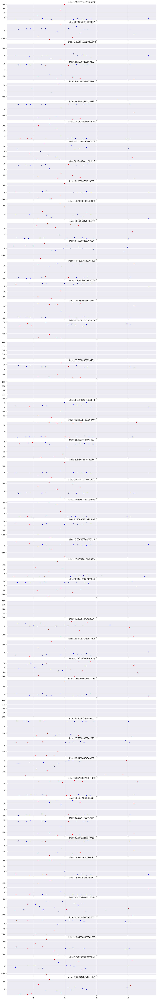

In [111]:
fig, axes = plt.subplots(50, 1, figsize=(15, 100), sharex=True)
random.seed(0)
track = tracks['A']
kilos = track['キロ程'].unique()

n_days = [365, 363, 365, 357]
n_day = n_days[0]
n_kilo = len(track['キロ程'].unique())

for i, kilo in enumerate(random.sample(list(kilos), 50)):
    ind = kilo.astype(int) - 10000
    inds = [ind + n_kilo*j for j in range(n_day)]
    data = track.loc[inds, ['date', '高低左']]
    data = data.dropna()
    data = data.reset_index(drop=True)

    data = data.loc[data['date'] >= "2018-03-01"]
    data = data.reset_index(drop=True)
    data['day'] = get_day(data['date'])
    data = data.drop(['date'], axis=1)
    if len(data) < 4:
        print(i)
        continue

    alll = data.index.values
#    print(alll)
    normal = kd_outliers1(data)
#    print(normal)

    out = set(data.index.values) - set(normal)
#    print(out)

    datao = data.loc[out]
    datal = data.loc[normal]
    interception = np.median(datal['高低左'].values)

    axes[i].plot(datao['day'], datao['高低左'], marker='.', linewidth=0, c='r')
    axes[i].plot(datal['day'], datal['高低左'], marker='.', linewidth=0, c='b')
    axes[i].set_title(f'inter: {interception}')

In [26]:
%%time
for i, no in tqdm(enumerate(['A', 'B', 'C', 'D'])):
    track = tracks[no]
    track = track.dropna(subset=['高低左'])
    track = track.reset_index(drop=True)

    summary = summarys[no]
#    summary = summary.dropna()
    kilos = summary['キロ程'].values
##    kilos = track['キロ程'].unique()
#    kilos = [35683]
    interceptions = []
    for kilo in tqdm(kilos):
        data = track.loc[track['キロ程'] == kilo, ['date', '高低左']]
        data = data.dropna(subset=['高低左'])
        data = data.reset_index(drop=True)

        data = data.loc[data['date'] >= "2018-03-01"]
        data = data.reset_index(drop=True)
        if len(data) == 0:
            print(f'{kilo}    !!! len(data) == 0 !!!')
            interceptions.append(np.median(track.loc[track['キロ程'] == kilo, '高低左'].values[-10:]))
            continue
        if len(data) < 4:
            print(kilo)
            interceptions.append(np.median(data['高低左'].values))
            continue

        data['day'] = get_day(data['date'])
        data = data.drop(['date'], axis=1)
#        normal_id = lof_outliers2(data)
        normal_id = kd_outliers1(data)
        data = data.loc[normal_id]
        interceptions.append(np.median(data['高低左'].values))
#        print(kilo, np.median(data['高低左'].values))
#    print(len(interceptions))
    summarys[no]['切片'] = interceptions

0it [00:00, ?it/s]
  0%|          | 48/27906 [00:03<39:57, 11.62it/s]



KeyboardInterrupt: 

In [124]:
for no in ['A', 'B', 'C', 'D']:
    summarys[no].to_csv(f'summary4_{no}.csv')

19


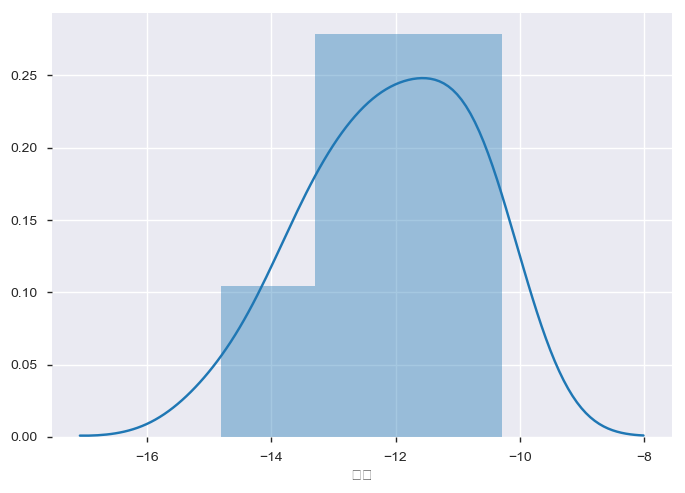

In [126]:
summary = summarys['A']
check = summary.loc[summary['切片'] < -10]
print(len(check))
sns.distplot(check['切片'])

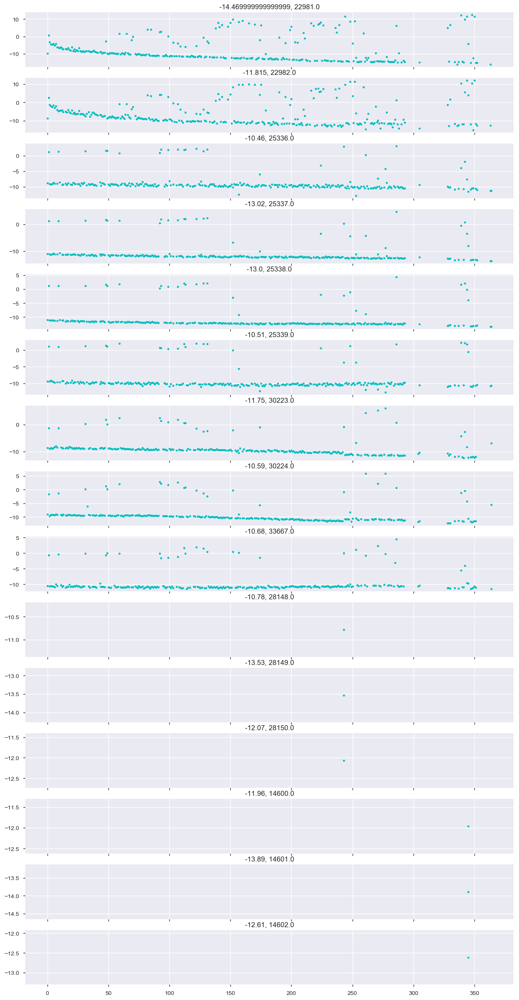

In [82]:
track = tracks['A']
track = track.dropna(subset=['高低左'])
track = track.reset_index(drop=True)
summary = summarys['A']
check = summary.loc[summary['切片'] < -10]
check = check.reset_index(drop=True)
inters = check['切片'].values
kilos = check['キロ程'].values
num = len(kilos)

fig, axes = plt.subplots(num, 1, figsize=(15, 2*num), sharex=True)

for i, kilo in enumerate(kilos):
    data = track.loc[track['キロ程'] == kilo, ['date', '高低左']]
    data = data.dropna(subset=['高低左'])
    data = data.reset_index(drop=True)
    data['day'] = get_day(data['date'])
    data = data.drop(['date'], axis=1)
    axes[i].plot(data['day'], data['高低左'], marker='.', linewidth=0, c='c')

#    normal_id = remove_outliers(data)
#    data = data.loc[normal_id]
#    axes[i].plot(data['day'], data['高低左'], marker='.', linewidth=0, c='b')
    inter = inters[i]
    axes[i].set_title(f'{inter}, {kilo}')

9


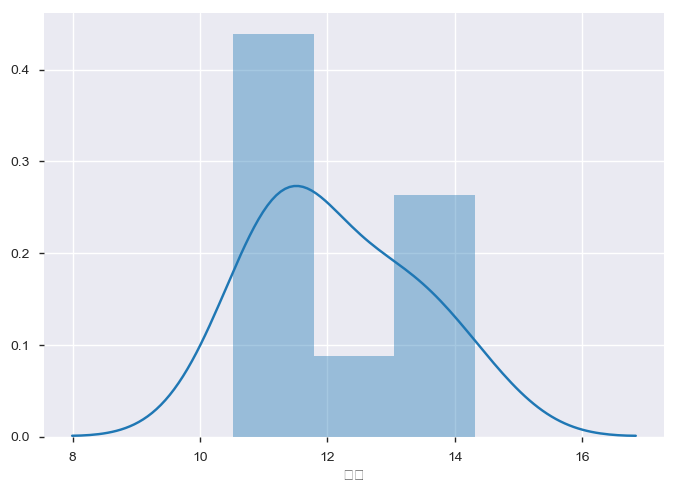

In [127]:
summary = summarys['A']
check = summary.loc[summary['切片'] > 10]
print(len(check))
sns.distplot(check['切片'])

/Users/a0082273/.pyenv/versions/anaconda3-5.1.0/lib/python3.6/site-packages/sklearn/neighbors/lof.py:180: UserWarning: n_neighbors (20) is greater than the total number of samples (8). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))


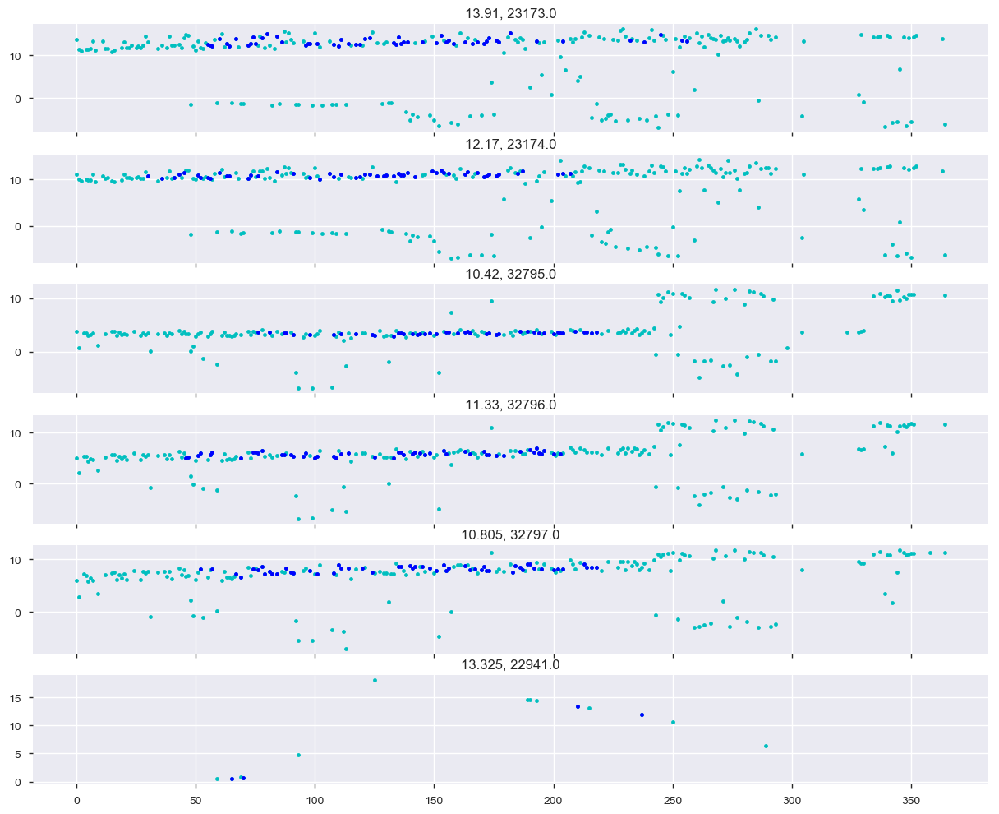

In [84]:
track = tracks['A']
track = track.dropna(subset=['高低左'])
track = track.reset_index(drop=True)
summary = summarys['A']
check = summary[summary['切片'] > 10]
check = check.reset_index(drop=True)
slopes = check['切片'].values
kilos = check['キロ程'].values
num = len(kilos)

fig, axes = plt.subplots(num, 1, figsize=(15, 2*num), sharex=True)

for i, kilo in enumerate(kilos):
    data = track.loc[track['キロ程'] == kilo, ['date', '高低左']]
    data = data.dropna(subset=['高低左'])
    data = data.reset_index(drop=True)
    data['day'] = get_day(data['date'])
    data = data.drop(['date'], axis=1)
    axes[i].plot(data['day'], data['高低左'], marker='.', linewidth=0, c='c')

    normal_id = remove_outliers(data)
    data = data.loc[normal_id]
    axes[i].plot(data['day'], data['高低左'], marker='.', linewidth=0, c='b')

    slope = slopes[i]
    axes[i].set_title(f'{slope}, {kilo}')

47


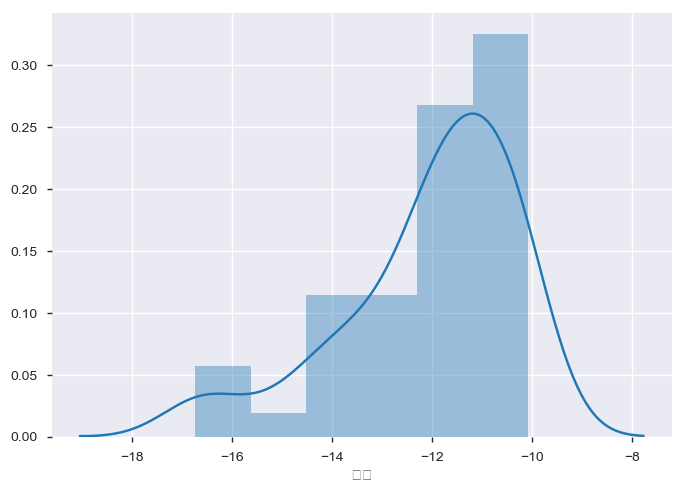

In [128]:
summary = summarys['B']
check = summary.loc[summary['切片'] < -10]
print(len(check))
sns.distplot(check['切片'])

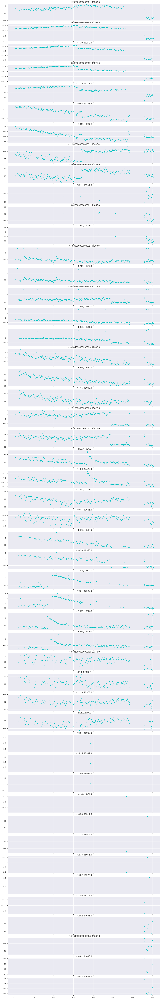

In [307]:
track = tracks['B']
track = track.dropna(subset=['高低左'])
track = track.reset_index(drop=True)
summary = summarys['B']
check = summary.loc[summary['切片'] < -10]
check = check.reset_index(drop=True)
inters = check['切片'].values
kilos = check['キロ程'].values
num = len(kilos)

fig, axes = plt.subplots(num, 1, figsize=(15, 2*num), sharex=True)

for i, kilo in enumerate(kilos):
    data = track.loc[track['キロ程'] == kilo, ['date', '高低左']]
    data = data.dropna(subset=['高低左'])
    data = data.reset_index(drop=True)
    data['day'] = get_day(data['date'])
    data = data.drop(['date'], axis=1)
    axes[i].plot(data['day'], data['高低左'], marker='.', linewidth=0, c='c')

#    normal_id = remove_outliers(data)
#    data = data.loc[normal_id]
#    axes[i].plot(data['day'], data['高低左'], marker='.', linewidth=0, c='b')
    inter = inters[i]
    axes[i].set_title(f'{inter}, {kilo}')

28


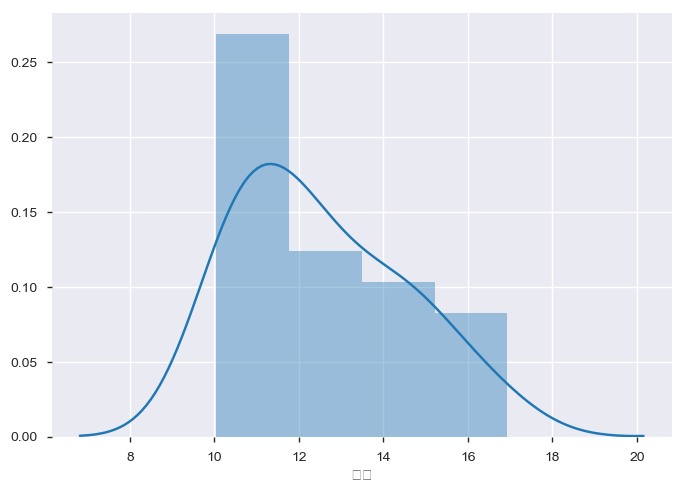

In [129]:
summary = summarys['B']
check = summary.loc[summary['切片'] > 10]
print(len(check))
sns.distplot(check['切片'])

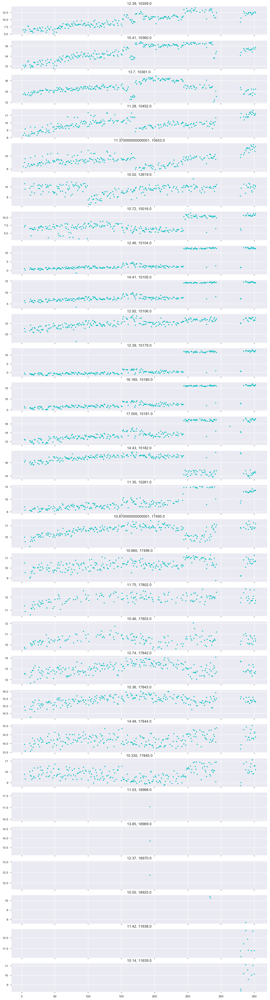

In [309]:
track = tracks['B']
track = track.dropna(subset=['高低左'])
track = track.reset_index(drop=True)
summary = summarys['B']
check = summary[summary['切片'] > 10]
check = check.reset_index(drop=True)
slopes = check['切片'].values
kilos = check['キロ程'].values
num = len(kilos)

fig, axes = plt.subplots(num, 1, figsize=(15, 2*num), sharex=True)

for i, kilo in enumerate(kilos):
    data = track.loc[track['キロ程'] == kilo, ['date', '高低左']]
    data = data.dropna(subset=['高低左'])
    data = data.reset_index(drop=True)
    data['day'] = get_day(data['date'])
    data = data.drop(['date'], axis=1)
    axes[i].plot(data['day'], data['高低左'], marker='.', linewidth=0, c='c')

#    normal_id = remove_outliers(data)
#    data = data.loc[normal_id]
#    axes[i].plot(data['day'], data['高低左'], marker='.', linewidth=0, c='b')

    slope = slopes[i]
    axes[i].set_title(f'{slope}, {kilo}')

73


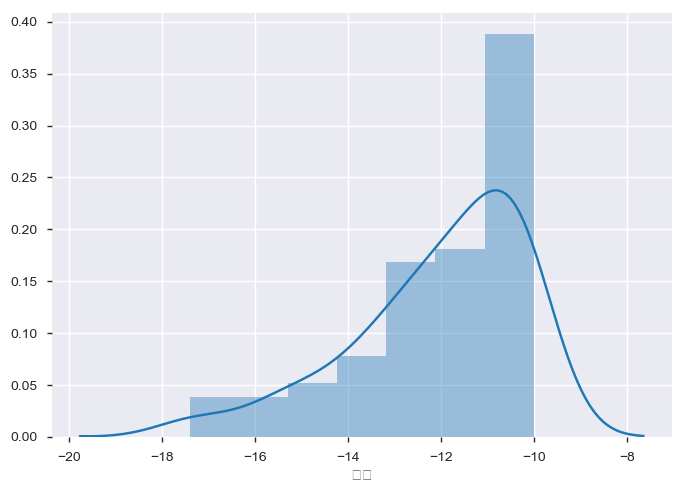

In [310]:
summary = summarys['C']
check = summary.loc[summary['切片'] < -10]
print(len(check))
sns.distplot(check['切片'])

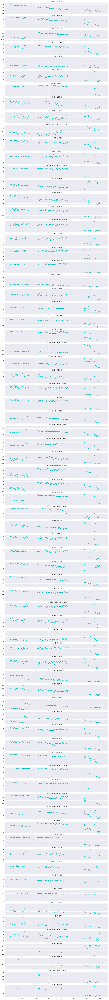

In [311]:
track = tracks['C']
track = track.dropna(subset=['高低左'])
track = track.reset_index(drop=True)
summary = summarys['C']
check = summary.loc[summary['切片'] < -10]
check = check.reset_index(drop=True)
inters = check['切片'].values
kilos = check['キロ程'].values
num = len(kilos)

fig, axes = plt.subplots(num, 1, figsize=(15, 2*num), sharex=True)

for i, kilo in enumerate(kilos):
    data = track.loc[track['キロ程'] == kilo, ['date', '高低左']]
    data = data.dropna(subset=['高低左'])
    data = data.reset_index(drop=True)
    data['day'] = get_day(data['date'])
    data = data.drop(['date'], axis=1)
    axes[i].plot(data['day'], data['高低左'], marker='.', linewidth=0, c='c')

#    normal_id = remove_outliers(data)
#    data = data.loc[normal_id]
#    axes[i].plot(data['day'], data['高低左'], marker='.', linewidth=0, c='b')
    inter = inters[i]
    axes[i].set_title(f'{inter}, {kilo}')

65


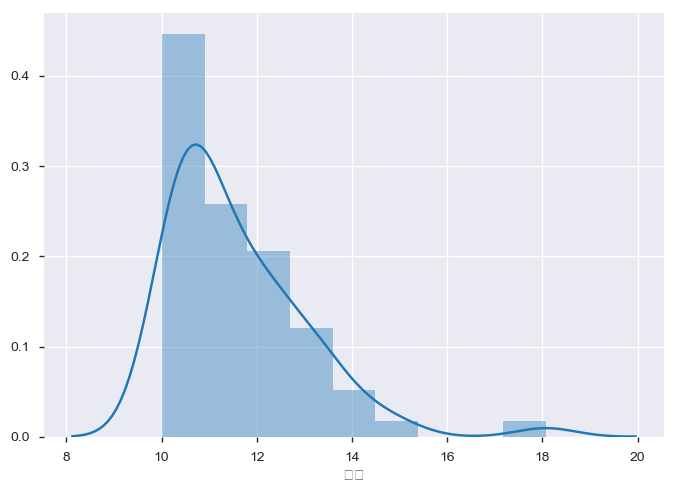

In [312]:
summary = summarys['C']
check = summary.loc[summary['切片'] > 10]
print(len(check))
sns.distplot(check['切片'])

/Users/a0082273/.pyenv/versions/anaconda3-5.1.0/lib/python3.6/site-packages/sklearn/neighbors/lof.py:180: UserWarning: n_neighbors (20) is greater than the total number of samples (19). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/anaconda3-5.1.0/lib/python3.6/site-packages/sklearn/neighbors/lof.py:180: UserWarning: n_neighbors (20) is greater than the total number of samples (11). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/anaconda3-5.1.0/lib/python3.6/site-packages/sklearn/neighbors/lof.py:180: UserWarning: n_neighbors (20) is greater than the total number of samples (12). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/anaconda3-5.1.0/lib/python3.6/site-packages/sklearn/neighbors/lof.py:180: UserWarning: n_neighbors (20) is greater than the tota

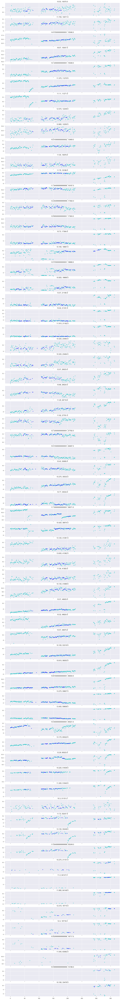

In [313]:
track = tracks['C']
track = track.dropna(subset=['高低左'])
track = track.reset_index(drop=True)
summary = summarys['C']
check = summary[summary['切片'] > 10]
check = check.reset_index(drop=True)
slopes = check['切片'].values
kilos = check['キロ程'].values
num = len(kilos)

fig, axes = plt.subplots(num, 1, figsize=(15, 2*num), sharex=True)

for i, kilo in enumerate(kilos):
    data = track.loc[track['キロ程'] == kilo, ['date', '高低左']]
    data = data.dropna(subset=['高低左'])
    data = data.reset_index(drop=True)
    data['day'] = get_day(data['date'])
    data = data.drop(['date'], axis=1)
    axes[i].plot(data['day'], data['高低左'], marker='.', linewidth=0, c='c')

    normal_id = remove_outliers(data)
    data = data.loc[normal_id]
    axes[i].plot(data['day'], data['高低左'], marker='.', linewidth=0, c='b')

    slope = slopes[i]
    axes[i].set_title(f'{slope}, {kilo}')

102


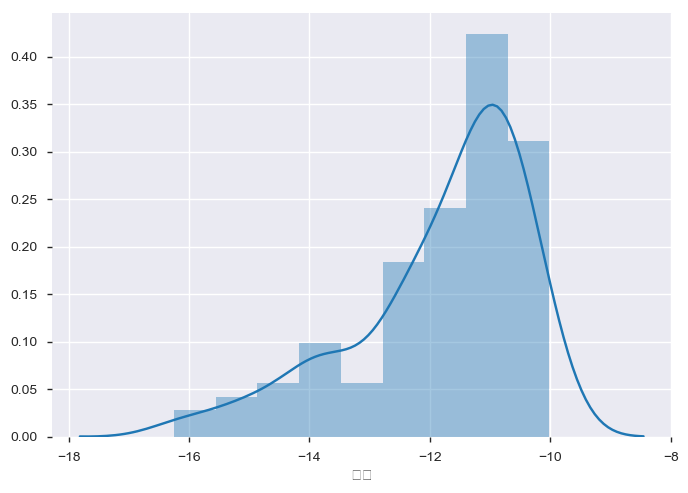

In [314]:
summary = summarys['D']
check = summary.loc[summary['切片'] < -10]
print(len(check))
sns.distplot(check['切片'])

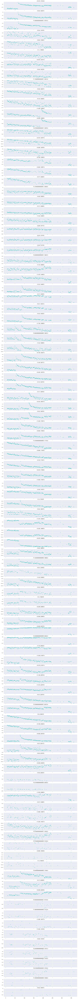

In [315]:
track = tracks['D']
track = track.dropna(subset=['高低左'])
track = track.reset_index(drop=True)
summary = summarys['D']
check = summary.loc[summary['切片'] < -10]
check = check.reset_index(drop=True)
inters = check['切片'].values
kilos = check['キロ程'].values
num = len(kilos)

fig, axes = plt.subplots(num, 1, figsize=(15, 2*num), sharex=True)

for i, kilo in enumerate(kilos):
    data = track.loc[track['キロ程'] == kilo, ['date', '高低左']]
    data = data.dropna(subset=['高低左'])
    data = data.reset_index(drop=True)
    data['day'] = get_day(data['date'])
    data = data.drop(['date'], axis=1)
    axes[i].plot(data['day'], data['高低左'], marker='.', linewidth=0, c='c')

#    normal_id = remove_outliers(data)
#    data = data.loc[normal_id]
#    axes[i].plot(data['day'], data['高低左'], marker='.', linewidth=0, c='b')
    inter = inters[i]
    axes[i].set_title(f'{inter}, {kilo}')

55


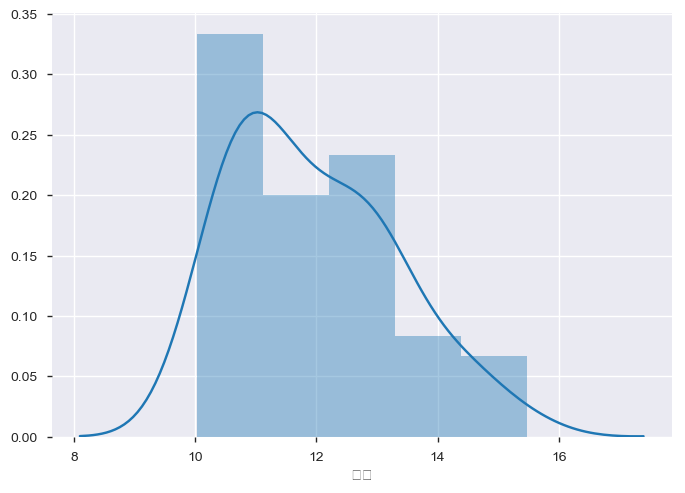

In [316]:
summary = summarys['D']
check = summary.loc[summary['切片'] > 10]
print(len(check))
sns.distplot(check['切片'])

/Users/a0082273/.pyenv/versions/anaconda3-5.1.0/lib/python3.6/site-packages/sklearn/neighbors/lof.py:180: UserWarning: n_neighbors (20) is greater than the total number of samples (16). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/anaconda3-5.1.0/lib/python3.6/site-packages/sklearn/neighbors/lof.py:180: UserWarning: n_neighbors (20) is greater than the total number of samples (17). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/anaconda3-5.1.0/lib/python3.6/site-packages/sklearn/neighbors/lof.py:180: UserWarning: n_neighbors (20) is greater than the total number of samples (2). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))
/Users/a0082273/.pyenv/versions/anaconda3-5.1.0/lib/python3.6/site-packages/sklearn/neighbors/lof.py:180: UserWarning: n_neighbors (20) is greater than the total

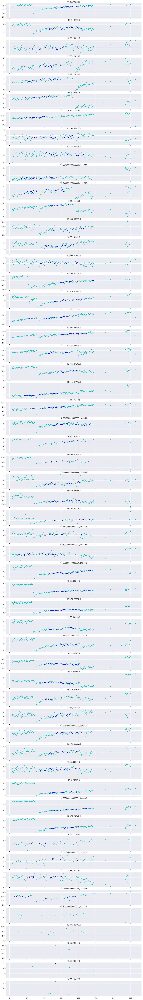

In [317]:
track = tracks['D']
track = track.dropna(subset=['高低左'])
track = track.reset_index(drop=True)
summary = summarys['D']
check = summary[summary['切片'] > 10]
check = check.reset_index(drop=True)
slopes = check['切片'].values
kilos = check['キロ程'].values
num = len(kilos)

fig, axes = plt.subplots(num, 1, figsize=(15, 2*num), sharex=True)

for i, kilo in enumerate(kilos):
    data = track.loc[track['キロ程'] == kilo, ['date', '高低左']]
    data = data.dropna(subset=['高低左'])
    data = data.reset_index(drop=True)
    data['day'] = get_day(data['date'])
    data = data.drop(['date'], axis=1)
    axes[i].plot(data['day'], data['高低左'], marker='.', linewidth=0, c='c')

    normal_id = remove_outliers(data)
    data = data.loc[normal_id]
    axes[i].plot(data['day'], data['高低左'], marker='.', linewidth=0, c='b')

    slope = slopes[i]
    axes[i].set_title(f'{slope}, {kilo}')

In [27]:
%%time
submit = pd.DataFrame()
for no in ['A', 'B', 'C', 'D']:
    track = tracks[no]
    summary = summarys[no]
    summary = summary.dropna()

    sub = pd.DataFrame()
    sub['キロ程'] = track['キロ程'].unique()
    sub['路線'] = no

    kilos = summary['キロ程'].values
    inds = kilos.astype(int) - 10000

    sub.loc[inds, '傾き'] = summary['傾き'].values
    sub.loc[inds, '切片'] = summary['切片'].values
    
    submit = pd.concat([submit, sub], axis=0)
submit = submit.reset_index(drop=True)

CPU times: user 1.67 s, sys: 493 ms, total: 2.16 s
Wall time: 2.24 s


In [28]:
submit

,キロ程,路線,傾き,切片
0,10000,A,-0.002529,0.090
1,10001,A,-0.002325,1.945
2,10002,A,-0.002152,4.405
3,10003,A,-0.003085,5.670
4,10004,A,-0.001037,4.905
5,10005,A,0.000794,1.820
6,10006,A,0.001475,-2.775
7,10007,A,0.001710,-6.910
8,10008,A,0.002742,-8.585
9,10009,A,0.000384,-7.070


In [29]:
submit.loc[submit['傾き'] == -100, '傾き'] = np.median(submit.loc[submit['傾き'].notnull(), '傾き'])
submit.loc[submit['傾き'].isnull(), '傾き'] = np.median(submit.loc[submit['傾き'].notnull(), '傾き'])
submit.loc[submit['切片'].isnull(), '切片'] = np.median(submit.loc[submit['切片'].notnull(), '切片'])

In [30]:
pdp.ProfileReport(submit)

Number of variables,4
Number of observations,120812
Total Missing (%),0.0%
Total size in memory,3.7 MiB
Average record size in memory,32.0 B
Numeric,3
Categorical,1
Boolean,0
Date,0
Text (Unique),0
Rejected,0


In [31]:
p = []
last_median_day = 30
for no in ['A', 'B', 'C', 'D']:
    tmp = submit[submit['路線'] == no]
    for i in range(91):
        day = tmp['切片'].values + tmp['傾き'].values*(i+last_median_day//2)
        p.extend(day)

submision = pd.DataFrame(p)
print(sum(submision.isnull()))
submision = submision.fillna(0)
submision = submision.apply(lambda x:x.round(2)) #サイズが大きいため予測値を桁落とし

0


In [32]:
submision.max()

0    19.35
dtype: float64

In [33]:
submision.min()

0   -18.62
dtype: float64

In [137]:
submision.loc[submision[0] > 16, 0] = 16
submision.loc[submision[0] < -16, 0] = -16

In [138]:
submision.max()

0    16.0
dtype: float64

In [139]:
submision.min()

0   -16.0
dtype: float64

In [140]:
submision

,0
0,0.53
1,2.64
2,4.97
3,5.83
4,5.02
5,1.66
6,-3.08
7,-7.21
8,-8.81
9,-7.40


Text(0.5, 1.0, 'kilo: 37670,  kilo_id: 27670')

Text(0.5, 1.0, 'kilo: 22623,  kilo_id: 12623')

Text(0.5, 1.0, 'kilo: 34836,  kilo_id: 24836')

Text(0.5, 1.0, 'kilo: 23781,  kilo_id: 13781')

/Users/a0082273/.pyenv/versions/miniconda3-latest/lib/python3.6/site-packages/sklearn/neighbors/lof.py:253: UserWarning: n_neighbors (20) is greater than the total number of samples (2). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))


Text(0.5, 1.0, 'kilo: 11326,  kilo_id: 1326')

Text(0.5, 1.0, 'kilo: 18484,  kilo_id: 8484')

Text(0.5, 1.0, 'kilo: 26753,  kilo_id: 16753')

Text(0.5, 1.0, 'kilo: 25922,  kilo_id: 15922')

Text(0.5, 1.0, 'kilo: 23268,  kilo_id: 13268')

Text(0.5, 1.0, 'kilo: 35683,  kilo_id: 25683')

Text(0.5, 1.0, 'kilo: 37192,  kilo_id: 27192')

Text(0.5, 1.0, 'kilo: 19938,  kilo_id: 9938')

Text(0.5, 1.0, 'kilo: 25617,  kilo_id: 15617')

Text(0.5, 1.0, 'kilo: 21732,  kilo_id: 11732')

Text(0.5, 1.0, 'kilo: 29116,  kilo_id: 19116')

Text(0.5, 1.0, 'kilo: 17157,  kilo_id: 7157')

Text(0.5, 1.0, 'kilo: 26537,  kilo_id: 16537')

17


Text(0.5, 1.0, 'kilo: 19235,  kilo_id: 9235')

ValueError: Found array with 0 sample(s) (shape=(0, 1)) while a minimum of 1 is required by StandardScaler.

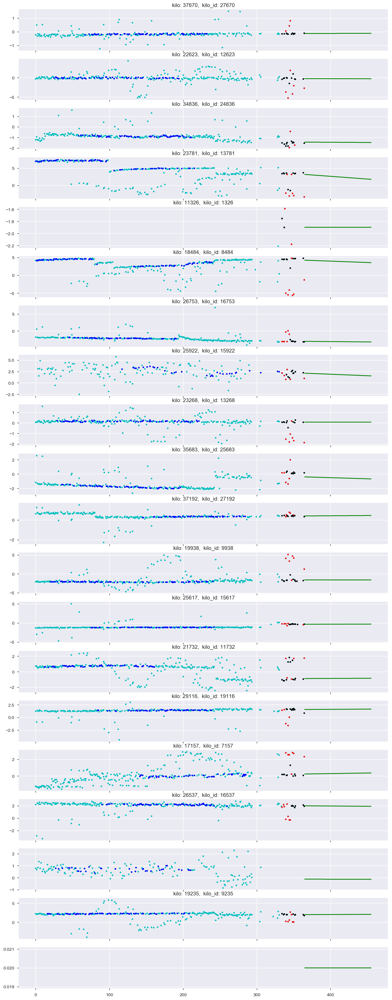

In [34]:
random.seed(0)

fig, axes = plt.subplots(20, 1, figsize=(15, 40), sharex=True)

track = tracks['A']
kilos = track['キロ程'].unique()
for i, kilo in enumerate(random.sample(list(kilos), 20)):
    data = track.loc[track['キロ程'] == kilo, ['date', '高低左']]
    data = data.dropna(subset=['高低左'])
    data = data.reset_index(drop=True)
    data['day'] = get_day(data['date'])
    data = data.drop(['date'], axis=1)
    axes[i].plot(data['day'], data['高低左'], marker='.', linewidth=0, c='c')

    kilo_id = kilo - 10000
    hoge = [kilo_id + i*len(kilos) for i in range(91)]
    piyo = submision.loc[hoge, 0]
    axes[i].plot(range(365, 365 + 91), piyo, c='g')

    normal_id = remove_outliers(data)
    data = data.loc[normal_id]
    axes[i].plot(data['day'], data['高低左'], marker='.', linewidth=0, c='b')


    data = track.loc[track['キロ程'] == kilo, ['date', '高低左']]
    data = data.dropna(subset=['高低左'])
    data = data.loc[data['date'] >= "2018-03-01"]
    data = data.reset_index(drop=True)
    data['day'] = get_day(data['date'])
    data = data.drop(['date'], axis=1)
    if len(data) < 4:
        print(i)
        continue
    alll = data.index.values
    normal = kd_outliers1(data)
    out = set(data.index.values) - set(normal)
    datao = data.loc[out]
    datal = data.loc[normal]
    interception = np.median(datal['高低左'].values)
    axes[i].plot(datao['day'], datao['高低左'], marker='.', linewidth=0, c='r')
    axes[i].plot(datal['day'], datal['高低左'], marker='.', linewidth=0, c='k')


    axes[i].set_title(f'kilo: {kilo},  kilo_id: {kilo_id}')

Text(0.5, 1.0, 'kilo: 22623,  kilo_id: 12623')

Text(0.5, 1.0, 'kilo: 23781,  kilo_id: 13781')

Text(0.5, 1.0, 'kilo: 11326,  kilo_id: 1326')

Text(0.5, 1.0, 'kilo: 18484,  kilo_id: 8484')

Text(0.5, 1.0, 'kilo: 26753,  kilo_id: 16753')

Text(0.5, 1.0, 'kilo: 25922,  kilo_id: 15922')

Text(0.5, 1.0, 'kilo: 23268,  kilo_id: 13268')

Text(0.5, 1.0, 'kilo: 19938,  kilo_id: 9938')

Text(0.5, 1.0, 'kilo: 25617,  kilo_id: 15617')

Text(0.5, 1.0, 'kilo: 21732,  kilo_id: 11732')

Text(0.5, 1.0, 'kilo: 29116,  kilo_id: 19116')

Text(0.5, 1.0, 'kilo: 17157,  kilo_id: 7157')

Text(0.5, 1.0, 'kilo: 26537,  kilo_id: 16537')

Text(0.5, 1.0, 'kilo: 14563,  kilo_id: 4563')

Text(0.5, 1.0, 'kilo: 19235,  kilo_id: 9235')

Text(0.5, 1.0, 'kilo: 14579,  kilo_id: 4579')

Text(0.5, 1.0, 'kilo: 13107,  kilo_id: 3107')

17


Text(0.5, 1.0, 'kilo: 18208,  kilo_id: 8208')

Text(0.5, 1.0, 'kilo: 27451,  kilo_id: 17451')

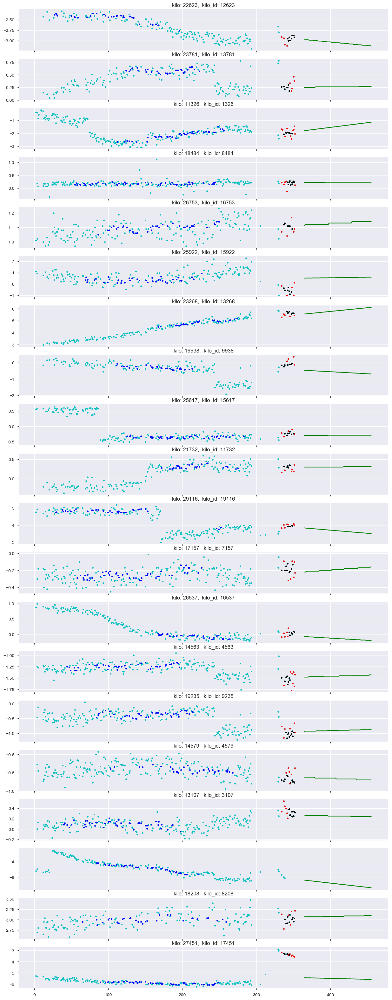

In [35]:
random.seed(0)

fig, axes = plt.subplots(20, 1, figsize=(15, 40), sharex=True)

track = tracks['B']
kilos = track['キロ程'].unique()
for i, kilo in enumerate(random.sample(list(kilos), 20)):
    data = track.loc[track['キロ程'] == kilo, ['date', '高低左']]
    data = data.dropna(subset=['高低左'])
    data = data.reset_index(drop=True)
    data['day'] = get_day(data['date'])
    data = data.drop(['date'], axis=1)
    axes[i].plot(data['day'], data['高低左'], marker='.', linewidth=0, c='c')

    kilo_id = kilo - 10000
    hoge = [kilo_id + i*len(kilos) for i in range(91)]
    hoge = np.array(hoge) + len(tracks['A']['キロ程'].unique())*91
    piyo = submision.loc[hoge, 0]
    axes[i].plot(range(365, 365 + 91), piyo, c='g')

    normal_id = remove_outliers(data)
    data = data.loc[normal_id]
    axes[i].plot(data['day'], data['高低左'], marker='.', linewidth=0, c='b')


    data = track.loc[track['キロ程'] == kilo, ['date', '高低左']]
    data = data.dropna(subset=['高低左'])
    data = data.loc[data['date'] >= "2018-03-01"]
    data = data.reset_index(drop=True)
    data['day'] = get_day(data['date'])
    data = data.drop(['date'], axis=1)
    if len(data) < 4:
        print(i)
        continue
    alll = data.index.values
    normal = kd_outliers1(data)
    out = set(data.index.values) - set(normal)
    datao = data.loc[out]
    datal = data.loc[normal]
    interception = np.median(datal['高低左'].values)
    axes[i].plot(datao['day'], datao['高低左'], marker='.', linewidth=0, c='r')
    axes[i].plot(datal['day'], datal['高低左'], marker='.', linewidth=0, c='k')

    axes[i].set_title(f'kilo: {kilo},  kilo_id: {kilo_id}')

/Users/a0082273/.pyenv/versions/anaconda3-5.1.0/lib/python3.6/site-packages/sklearn/neighbors/lof.py:180: UserWarning: n_neighbors (20) is greater than the total number of samples (13). n_neighbors will be set to (n_samples - 1) for estimation.
  % (self.n_neighbors, n_samples))


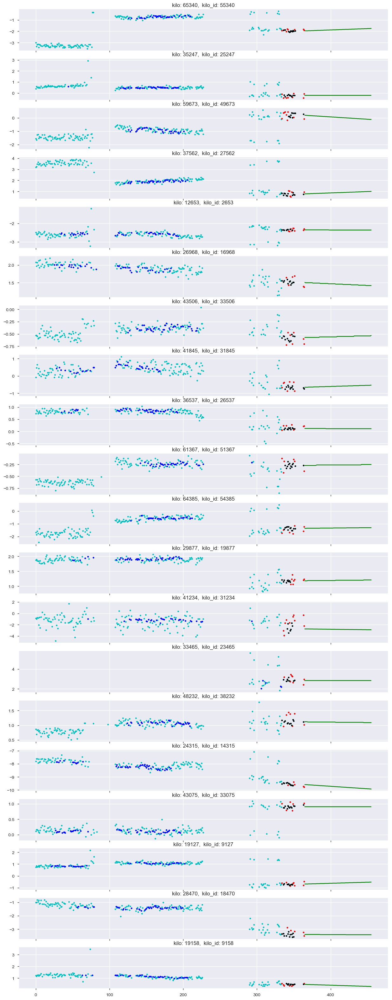

In [144]:
random.seed(0)

fig, axes = plt.subplots(20, 1, figsize=(15, 40), sharex=True)

track = tracks['C']
kilos = track['キロ程'].unique()
for i, kilo in enumerate(random.sample(list(kilos), 20)):
    data = track.loc[track['キロ程'] == kilo, ['date', '高低左']]
    data = data.dropna(subset=['高低左'])
    data = data.reset_index(drop=True)
    data['day'] = get_day(data['date'])
    data = data.drop(['date'], axis=1)
    axes[i].plot(data['day'], data['高低左'], marker='.', linewidth=0, c='c')

    kilo_id = kilo - 10000
    hoge = [kilo_id + i*len(kilos) for i in range(91)]
    hoge = np.array(hoge) + len(tracks['A']['キロ程'].unique())*91 + len(tracks['B']['キロ程'].unique())*91
    piyo = submision.loc[hoge, 0]
    axes[i].plot(range(365, 365 + 91), piyo, c='g')

    normal_id = remove_outliers(data)
    data = data.loc[normal_id]
    axes[i].plot(data['day'], data['高低左'], marker='.', linewidth=0, c='b')


    data = track.loc[track['キロ程'] == kilo, ['date', '高低左']]
    data = data.dropna(subset=['高低左'])
    data = data.loc[data['date'] >= "2018-03-01"]
    data = data.reset_index(drop=True)
    data['day'] = get_day(data['date'])
    data = data.drop(['date'], axis=1)
    if len(data) < 4:
        print(i)
        continue
    alll = data.index.values
    normal = kd_outliers1(data)
    out = set(data.index.values) - set(normal)
    datao = data.loc[out]
    datal = data.loc[normal]
    interception = np.median(datal['高低左'].values)
    axes[i].plot(datao['day'], datao['高低左'], marker='.', linewidth=0, c='r')
    axes[i].plot(datal['day'], datal['高低左'], marker='.', linewidth=0, c='k')


    axes[i].set_title(f'kilo: {kilo},  kilo_id: {kilo_id}')

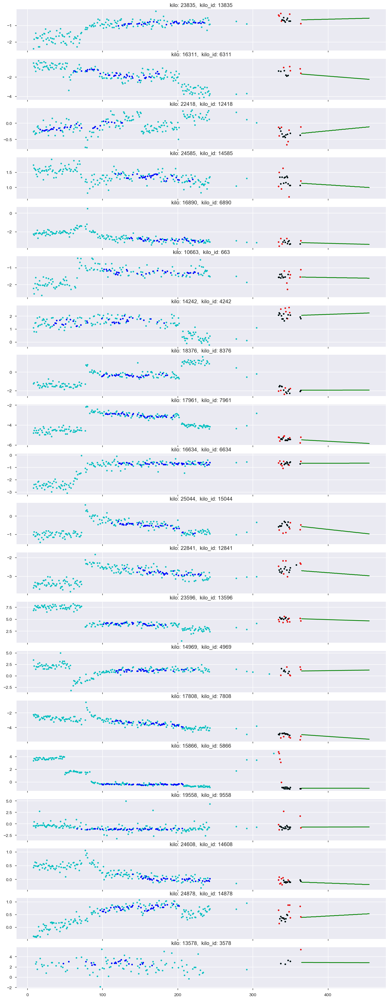

In [145]:
random.seed(0)

fig, axes = plt.subplots(20, 1, figsize=(15, 40), sharex=True)

track = tracks['D']
kilos = track['キロ程'].unique()
for i, kilo in enumerate(random.sample(list(kilos), 20)):
    data = track.loc[track['キロ程'] == kilo, ['date', '高低左']]
    data = data.dropna(subset=['高低左'])
    data = data.reset_index(drop=True)
    data['day'] = get_day(data['date'])
    data = data.drop(['date'], axis=1)
    axes[i].plot(data['day'], data['高低左'], marker='.', linewidth=0, c='c')

    kilo_id = kilo - 10000
    hoge = [kilo_id + i*len(kilos) for i in range(91)]
    hoge = np.array(hoge) + len(tracks['A']['キロ程'].unique())*91 + len(tracks['B']['キロ程'].unique())*91 + len(tracks['C']['キロ程'].unique())*91
    piyo = submision.loc[hoge, 0]
    axes[i].plot(range(365, 365 + 91), piyo, c='g')

    normal_id = remove_outliers(data)
    data = data.loc[normal_id]
    axes[i].plot(data['day'], data['高低左'], marker='.', linewidth=0, c='b')


    data = track.loc[track['キロ程'] == kilo, ['date', '高低左']]
    data = data.dropna(subset=['高低左'])
    data = data.loc[data['date'] >= "2018-03-01"]
    data = data.reset_index(drop=True)
    data['day'] = get_day(data['date'])
    data = data.drop(['date'], axis=1)
    if len(data) < 4:
        print(i)
        continue
    alll = data.index.values
    normal = kd_outliers1(data)
    out = set(data.index.values) - set(normal)
    datao = data.loc[out]
    datal = data.loc[normal]
    interception = np.median(datal['高低左'].values)
    axes[i].plot(datao['day'], datao['高低左'], marker='.', linewidth=0, c='r')
    axes[i].plot(datal['day'], datal['高低左'], marker='.', linewidth=0, c='k')


    axes[i].set_title(f'kilo: {kilo},  kilo_id: {kilo_id}')

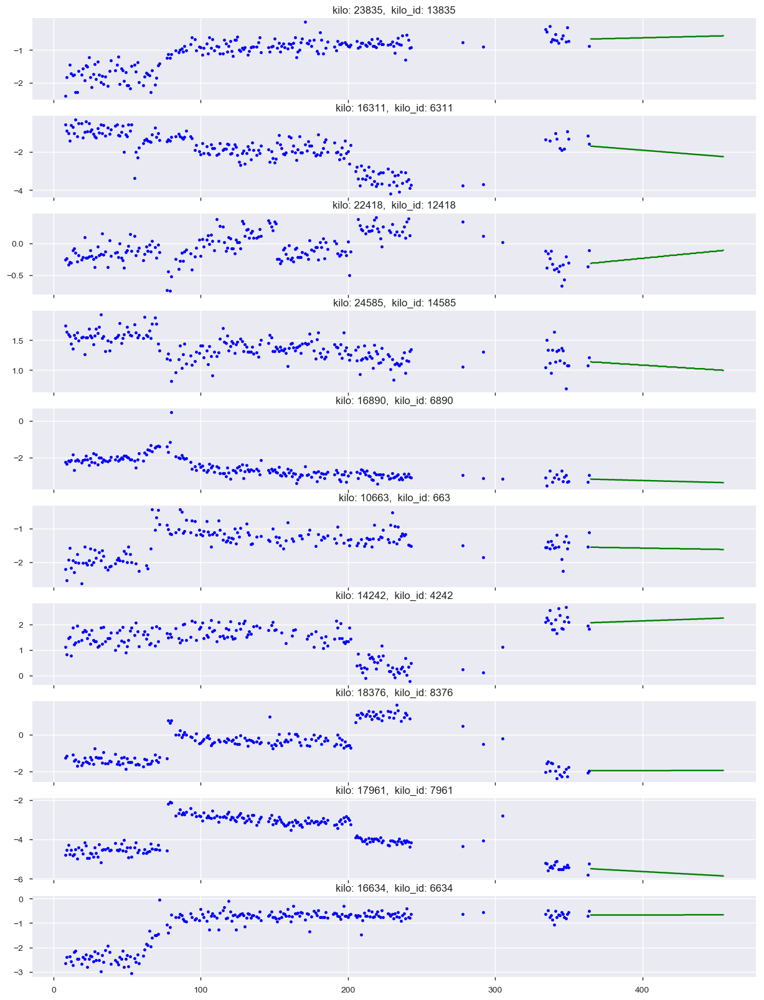

In [141]:
random.seed(0)

fig, axes = plt.subplots(10, 1, figsize=(15, 20), sharex=True)

track = tracks['D']
kilos = track['キロ程'].unique()
for i, kilo in enumerate(random.sample(list(kilos), 10)):
    data = track[track['キロ程'] == kilo]
    data = data.reset_index(drop=True)
    days = get_day(data['date'])
    axes[i].plot(days, data['高低左'], marker='.', linewidth=0, c='b')

    kilo_id = kilo - 10000
    hoge = [kilo_id + i*len(kilos) for i in range(91)]
    hoge = np.array(hoge) + len(tracks['A']['キロ程'].unique())*91 + len(tracks['B']['キロ程'].unique())*91 + len(tracks['C']['キロ程'].unique())*91
    piyo = submision.loc[hoge, 0]

    axes[i].plot(range(365, 365 + 91), piyo, c='g')

    axes[i].set_title(f'kilo: {kilo},  kilo_id: {kilo_id}')

In [146]:
submision.to_csv("submit4.csv", header=None)